# **IE Sustainability Datathon 2023:** 05b_ML Models (15mins - XGBoost - All sectors)



## 0. GENERAL CONFIG

### Modules & Libraries

In [1]:
#conda update scikit-learn

In [2]:
!pip install category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.8/81.8 kB 1.8 MB/s eta 0:00:00


In [3]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 409.6/409.6 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.8/226.8 kB 23.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 8.9 MB/s eta 0:00:00


In [4]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 6.5 MB/s eta 0:00:00


In [5]:
# IMPORT MODULES

# Base -----------------------------------------------------------
import pandas as pd
import numpy as np
import pathlib
import datetime as dt
from scipy.stats import norm
from datetime import datetime
#import pandas_profiling
from math import *

pd.options.display.float_format = "{:,.4f}".format

# Viz ------------------------------------------------------------
import matplotlib.pyplot as plt
import matplotlib.colors as ma
import matplotlib.font_manager as fm
import seaborn as sns
import plotly
import plotnine
from plotnine import *
#import patchworklib as pw
from mizani.formatters import date_format
from dateutil import tz
import shap

%matplotlib inline

In [6]:
import time
from datetime import timedelta

In [7]:
import sklearn
import matplotlib
import scipy
import statsmodels
import mlxtend
import category_encoders
import seaborn
import xgboost

In [8]:
from sklearn.preprocessing import LabelEncoder
#from sklearn.preprocessing import OrdinalEncoder
from category_encoders import OrdinalEncoder

In [9]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [10]:
import optuna

In [11]:
#importing all the plot functions
from optuna.visualization import plot_edf
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice

### Prepared Functions

In [12]:
def miss_info(df_data):

    # MISSING VALUES INFO (BY COLUMNS)

    df_colsnan = pd.DataFrame()
    df_colsnan['dtypes'] = df_data.apply(lambda x: x.dtypes)
    df_colsnan['nan'] = df_data.isnull().sum()
    df_colsnan['perc_nan'] = (df_data.isnull().sum() / df_data.shape[0]) * 100
    df_colsnan['perc_nan'] = df_colsnan['perc_nan'].round(2)
    df_colsnan['not_nan'] = df_data.notnull().sum()
    df_colsnan['perc_not_nan'] = (df_data.notnull().sum() / df_data.shape[0]) * 100
    df_colsnan['perc_not_nan'] = df_colsnan['perc_not_nan'].round(2)
    df_colsnan['unique_values'] = df_data.apply(lambda x: len(x.unique()) )
    df_colsnan['neg_values'] = df_data.apply(lambda x: x.lt(0).sum() if x.dtypes == 'float64' else 'NA')
    df_colsnan.reset_index(inplace=True)
    df_colsnan.rename(columns={'index':'col_name'}, inplace=True)

    return df_colsnan

In [13]:
def RowKey_transf(x):
    myDate = str(x.date())
    return dt.datetime.strptime(myDate, '%Y-%m-%d').strftime('%Y-%m-%dT00:00:00.000Z')

In [14]:
def mape_corr(y_true, y_pred):

  mape_value = mean_absolute_percentage_error(y_true, y_pred)
  if mape_value > 1500 and (y_true-y_pred).mean()<1:
    mape_value = 0

  return mape_value

In [15]:
def mape_corr_multi(y_true, y_pred):

  mape_value = mean_absolute_percentage_error(y_true, y_pred)

  if mape_value > 1500: #and (y_true-y_pred).mean()<1:
    mape_value = 0

  return mape_value

In [16]:
def df_cols2rows(df_data, datetime_col):

  sel_cols = [x for x in list(df_data.columns) if x!=datetime_col]

  for x in sel_cols:

    ind_x = sel_cols.index(x)
    #col_name = 'V_' + x.replace(' ','-')

    if ind_x==0:
      df_viz = df_data[[datetime_col,x]].copy()
      df_viz.rename({x:'INF_Value'}, axis=1, inplace=True)
      df_viz['STA_Name'] = x
    else:
      df_aux = df_data[[datetime_col,x]].copy()
      df_aux.rename({x:'INF_Value'}, axis=1, inplace=True)
      df_aux.reset_index(drop=True, inplace=True)
      df_aux['STA_Name'] = x

      df_viz = pd.concat([df_viz,df_aux], axis=0)
      df_viz.reset_index(drop=True, inplace=True)

  return df_viz


## 1. LOADING & PREPARING DATASET

### Loading dataset

In [104]:
from google.colab import drive
drive.mount('/content/GDrive')

Drive already mounted at /content/GDrive; to attempt to forcibly remount, call drive.mount("/content/GDrive", force_remount=True).


In [105]:
file_path = "/content/GDrive/MyDrive/IE - Datathon 2023/01_Data/DF_1mins76 (DayTime IMPUTED).csv"

In [106]:
df_1mins76 = pd.read_csv(file_path)
df_1mins76

,RowKey,RowKey_Date,RowKey_Time,DiaSem,Clasif_Lab,Clasif_Fest,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,...,Mes_SIN,Mes_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure,dew,humidity
0,2021-08-02 00:15:00+00:00,2021-08-02,00:15:00,Lunes,Laborable,No Festivo,1.1001,1.5938,11.1875,1.3512,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
1,2021-08-02 00:30:00+00:00,2021-08-02,00:30:00,Lunes,Laborable,No Festivo,1.2300,1.6562,10.3750,1.3548,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
2,2021-08-02 00:45:00+00:00,2021-08-02,00:45:00,Lunes,Laborable,No Festivo,1.1099,1.6250,10.0000,1.3203,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
3,2021-08-02 01:00:00+00:00,2021-08-02,01:00:00,Lunes,Laborable,No Festivo,1.1299,1.6875,9.1250,1.3028,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
4,2021-08-02 01:15:00+00:00,2021-08-02,01:15:00,Lunes,Laborable,No Festivo,1.1304,1.4375,8.3125,1.2634,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47735,2022-12-12 06:00:00+00:00,2022-12-12,06:00:00,Lunes,Laborable,No Festivo,0.1504,1.2891,0.0000,0.5800,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47736,2022-12-12 06:15:00+00:00,2022-12-12,06:15:00,Lunes,Laborable,No Festivo,0.1547,1.2786,0.0000,0.5900,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47737,2022-12-12 06:30:00+00:00,2022-12-12,06:30:00,Lunes,Laborable,No Festivo,0.1553,1.3128,0.0000,0.6700,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47738,2022-12-12 06:45:00+00:00,2022-12-12,06:45:00,Lunes,Laborable,No Festivo,0.1562,1.2463,0.0000,0.7200,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200


In [107]:
df_1mins76.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47740 entries, 0 to 47739
Data columns (total 42 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   RowKey            47740 non-null  object 
 1   RowKey_Date       47740 non-null  object 
 2   RowKey_Time       47740 non-null  object 
 3   DiaSem            47740 non-null  object 
 4   Clasif_Lab        47740 non-null  object 
 5   Clasif_Fest       47740 non-null  object 
 6   V_Carretera-Urda  47740 non-null  float64
 7   V_Centro          47740 non-null  float64
 8   V_Churruca        47740 non-null  float64
 9   V_Gasolinera      47740 non-null  float64
 10  V_Planta          47740 non-null  float64
 11  V_Poligono        47740 non-null  float64
 12  V_Sur-Este        47740 non-null  float64
 13  V_Valladolid      47740 non-null  float64
 14  Day_00-06         47740 non-null  float64
 15  Day_06-09         47740 non-null  float64
 16  Day_09-14         47740 non-null  float6

In [108]:
df_1mins76.describe()

,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,V_Valladolid,Day_00-06,Day_06-09,...,Mes_SIN,Mes_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure,dew,humidity
count,"47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000",...,"47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000"
mean,0.4873,1.6039,9.0144,1.5228,2.9831,1.0229,6.7248,9.4689,0.2295,0.1250,...,-0.2109,-0.0361,17.0798,23.2371,15.5070,9.9209,327.9043,"1,018.1784",6.5815,57.9125
std,0.6936,1.1037,6.6143,0.9922,2.2196,0.8187,2.4511,4.4308,0.4205,0.3308,...,0.7043,0.6769,8.4507,9.1747,7.3822,7.2236,122.9250,5.4777,4.0867,21.1477
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,-1.0000,-1.0000,1.2000,5.9000,2.1000,-5.5000,55.1000,"1,001.8000",-6.4000,10.4900
25%,0.0698,0.7648,0.2217,0.8900,1.3498,0.5066,5.1250,6.8750,0.0000,0.0000,...,-0.8660,-0.5000,9.6000,14.7000,9.5000,4.3000,243.4000,"1,014.3000",3.9000,39.5300
50%,0.1704,1.7300,9.8750,1.3200,3.1094,0.6989,6.5000,9.2500,0.0000,0.0000,...,-0.5000,-0.0000,17.0000,23.3000,15.1000,9.9000,341.2000,"1,017.7000",6.9000,60.0000
75%,0.5391,2.3691,14.1250,1.9600,4.5625,1.2800,8.2500,12.3750,0.0000,0.0000,...,0.5000,0.5000,24.0000,30.3000,22.8000,15.8000,436.6000,"1,021.5000",9.2000,76.1700
max,4.9800,8.4023,31.5000,8.6100,17.4805,7.9275,37.6250,42.0999,1.0000,1.0000,...,1.0000,1.0000,33.9000,42.8000,28.2000,26.3000,557.6000,"1,033.1000",16.7000,97.7800


In [109]:
df_1mins76['V_Churruca']

0       11.1875
1       10.3750
2       10.0000
3        9.1250
4        8.3125
          ...  
47735    0.0000
47736    0.0000
47737    0.0000
47738    0.0000
47739    0.0000
Name: V_Churruca, Length: 47740, dtype: float64

### Dataset preparation

In [110]:
df_1mins76.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47740 entries, 0 to 47739
Data columns (total 42 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   RowKey            47740 non-null  object 
 1   RowKey_Date       47740 non-null  object 
 2   RowKey_Time       47740 non-null  object 
 3   DiaSem            47740 non-null  object 
 4   Clasif_Lab        47740 non-null  object 
 5   Clasif_Fest       47740 non-null  object 
 6   V_Carretera-Urda  47740 non-null  float64
 7   V_Centro          47740 non-null  float64
 8   V_Churruca        47740 non-null  float64
 9   V_Gasolinera      47740 non-null  float64
 10  V_Planta          47740 non-null  float64
 11  V_Poligono        47740 non-null  float64
 12  V_Sur-Este        47740 non-null  float64
 13  V_Valladolid      47740 non-null  float64
 14  Day_00-06         47740 non-null  float64
 15  Day_06-09         47740 non-null  float64
 16  Day_09-14         47740 non-null  float6

In [111]:
df_1mins76.columns

Index(['RowKey', 'RowKey_Date', 'RowKey_Time', 'DiaSem', 'Clasif_Lab',
       'Clasif_Fest', 'V_Carretera-Urda', 'V_Centro', 'V_Churruca',
       'V_Gasolinera', 'V_Planta', 'V_Poligono', 'V_Sur-Este', 'V_Valladolid',
       'Day_00-06', 'Day_06-09', 'Day_09-14', 'Day_14-16', 'Day_16-19',
       'Day_19-22', 'Day_22-00', 'Time_SIN', 'Time_COS', 'N_DiaMes', 'N_Mes',
       'N_Ano', 'Lab_PrevioFest', 'Lab_PostFest', 'DiaSem_SIN', 'DiaSem_COS',
       'Dia_SIN', 'Dia_COS', 'Mes_SIN', 'Mes_COS', 'temp', 'maxt',
       'solarenergy', 'mint', 'solarradiation', 'sealevelpressure', 'dew',
       'humidity'],
      dtype='object')

In [112]:

selcols_order = ['RowKey', 'RowKey_Date', 'RowKey_Time', 'V_Carretera-Urda', 'V_Centro', 'V_Churruca', 'V_Gasolinera', 'V_Planta', 'V_Poligono', 'V_Sur-Este', 'V_Valladolid',
                 'DiaSem', 'Clasif_Lab', 'Clasif_Fest', 'N_DiaMes', 'N_Mes', 'N_Ano', 'Lab_PrevioFest', 'Lab_PostFest', 'DiaSem_SIN', 'DiaSem_COS', 'Dia_SIN', 'Dia_COS',
                 'Mes_SIN', 'Mes_COS', 'Day_00-06', 'Day_06-09', 'Day_09-14', 'Day_14-16', 'Day_16-19', 'Day_19-22', 'Day_22-00', 'Time_SIN', 'Time_COS',
                'temp', 'maxt', 'solarenergy', 'mint', 'solarradiation', 'sealevelpressure', 'dew', 'humidity']


In [113]:
df_1mins76 = df_1mins76[selcols_order].copy()
df_1mins76

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,Time_SIN,Time_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure,dew,humidity
0,2021-08-02 00:15:00+00:00,2021-08-02,00:15:00,1.1001,1.5938,11.1875,1.3512,2.7969,1.4775,5.1550,...,0.0000,1.0000,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
1,2021-08-02 00:30:00+00:00,2021-08-02,00:30:00,1.2300,1.6562,10.3750,1.3548,2.7188,1.4775,5.1719,...,0.0654,0.9979,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
2,2021-08-02 00:45:00+00:00,2021-08-02,00:45:00,1.1099,1.6250,10.0000,1.3203,2.7344,1.4775,4.9506,...,0.1305,0.9914,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
3,2021-08-02 01:00:00+00:00,2021-08-02,01:00:00,1.1299,1.6875,9.1250,1.3028,2.2500,1.4775,4.4513,...,0.1951,0.9808,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
4,2021-08-02 01:15:00+00:00,2021-08-02,01:15:00,1.1304,1.4375,8.3125,1.2634,1.9375,1.4825,4.4944,...,0.2588,0.9659,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47735,2022-12-12 06:00:00+00:00,2022-12-12,06:00:00,0.1504,1.2891,0.0000,0.5800,1.5898,0.0025,6.3750,...,0.9979,0.0654,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47736,2022-12-12 06:15:00+00:00,2022-12-12,06:15:00,0.1547,1.2786,0.0000,0.5900,1.6360,0.2955,6.8750,...,1.0000,0.0000,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47737,2022-12-12 06:30:00+00:00,2022-12-12,06:30:00,0.1553,1.3128,0.0000,0.6700,1.7155,0.5057,7.2500,...,0.9979,-0.0654,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47738,2022-12-12 06:45:00+00:00,2022-12-12,06:45:00,0.1562,1.2463,0.0000,0.7200,2.0370,0.6889,8.2500,...,0.9914,-0.1305,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200


In [114]:
df_1mins76.describe()

,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,V_Valladolid,N_DiaMes,N_Mes,...,Time_SIN,Time_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure,dew,humidity
count,"47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000",...,"47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000"
mean,0.4873,1.6039,9.0144,1.5228,2.9831,1.0229,6.7248,9.4689,15.5412,7.3749,...,0.0004,0.0003,17.0798,23.2371,15.5070,9.9209,327.9043,"1,018.1784",6.5815,57.9125
std,0.6936,1.1037,6.6143,0.9922,2.2196,0.8187,2.4511,4.4308,8.8132,3.3385,...,0.7071,0.7071,8.4507,9.1747,7.3822,7.2236,122.9250,5.4777,4.0867,21.1477
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,...,-1.0000,-1.0000,1.2000,5.9000,2.1000,-5.5000,55.1000,"1,001.8000",-6.4000,10.4900
25%,0.0698,0.7648,0.2217,0.8900,1.3498,0.5066,5.1250,6.8750,8.0000,5.0000,...,-0.7071,-0.7071,9.6000,14.7000,9.5000,4.3000,243.4000,"1,014.3000",3.9000,39.5300
50%,0.1704,1.7300,9.8750,1.3200,3.1094,0.6989,6.5000,9.2500,15.0000,8.0000,...,0.0000,0.0000,17.0000,23.3000,15.1000,9.9000,341.2000,"1,017.7000",6.9000,60.0000
75%,0.5391,2.3691,14.1250,1.9600,4.5625,1.2800,8.2500,12.3750,23.0000,10.0000,...,0.7071,0.7071,24.0000,30.3000,22.8000,15.8000,436.6000,"1,021.5000",9.2000,76.1700
max,4.9800,8.4023,31.5000,8.6100,17.4805,7.9275,37.6250,42.0999,31.0000,12.0000,...,1.0000,1.0000,33.9000,42.8000,28.2000,26.3000,557.6000,"1,033.1000",16.7000,97.7800


In [115]:
# DATE COLUMN
'''
RowKey_Date
'''

# Column "FECHA_ALTA_SUMINISTRO"
df_1mins76['RowKey_Date'] = pd.to_datetime(df_1mins76['RowKey_Date'])


In [116]:
# CATEGORICAL NOMINAL
'''
DiaSem
Clasif_Lab
Clasif_Fest
'''

# Column "DiaSem"
data = df_1mins76['DiaSem']
df_1mins76['DiaSem'] = pd.Categorical(data, ordered=False)

# Column "Clasif_Lab"
data = df_1mins76['Clasif_Lab']
df_1mins76['Clasif_Lab'] = pd.Categorical(data, ordered=False)

# Column "Clasif_Fest"
data = df_1mins76['Clasif_Fest']
df_1mins76['Clasif_Fest'] = pd.Categorical(data, ordered=False)


In [117]:
# NUMERICAL DISCRETE
'''
N_DiaMes
N_Mes
N_Ano
Lab_PrevioFest
Lab_PostFest
'''

# Column "N_DiaMes"
df_1mins76['N_DiaMes'] = df_1mins76['N_DiaMes'].astype('int64')

# Column "N_Mes"
df_1mins76['N_Mes'] = df_1mins76['N_Mes'].astype('int64')

# Column "N_Ano"
df_1mins76['N_Ano'] = df_1mins76['N_Ano'].astype('int64')

# Column "Lab_PrevioFest"
df_1mins76['Lab_PrevioFest'] = df_1mins76['Lab_PrevioFest'].astype('int64')

# Column "Lab_PostFest"
df_1mins76['Lab_PostFest'] = df_1mins76['Lab_PostFest'].astype('int64')


In [118]:
df_1mins76.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47740 entries, 0 to 47739
Data columns (total 42 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   RowKey            47740 non-null  object        
 1   RowKey_Date       47740 non-null  datetime64[ns]
 2   RowKey_Time       47740 non-null  object        
 3   V_Carretera-Urda  47740 non-null  float64       
 4   V_Centro          47740 non-null  float64       
 5   V_Churruca        47740 non-null  float64       
 6   V_Gasolinera      47740 non-null  float64       
 7   V_Planta          47740 non-null  float64       
 8   V_Poligono        47740 non-null  float64       
 9   V_Sur-Este        47740 non-null  float64       
 10  V_Valladolid      47740 non-null  float64       
 11  DiaSem            47740 non-null  category      
 12  Clasif_Lab        47740 non-null  category      
 13  Clasif_Fest       47740 non-null  category      
 14  N_DiaMes          4774

In [119]:
miss_info(df_1mins76)

,col_name,dtypes,nan,perc_nan,not_nan,perc_not_nan,unique_values,neg_values
0,RowKey,object,0,0.0000,47740,100.0000,47740,NA
1,RowKey_Date,datetime64[ns],0,0.0000,47740,100.0000,498,NA
2,RowKey_Time,object,0,0.0000,47740,100.0000,96,NA
3,V_Carretera-Urda,float64,0,0.0000,47740,100.0000,1634,0
4,V_Centro,float64,0,0.0000,47740,100.0000,10280,0
5,V_Churruca,float64,0,0.0000,47740,100.0000,4520,0
6,V_Gasolinera,float64,0,0.0000,47740,100.0000,1089,0
7,V_Planta,float64,0,0.0000,47740,100.0000,15109,0
8,V_Poligono,float64,0,0.0000,47740,100.0000,3440,0
9,V_Sur-Este,float64,0,0.0000,47740,100.0000,948,0


In [120]:
df_1mins76.describe()

,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,V_Valladolid,N_DiaMes,N_Mes,...,Time_SIN,Time_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure,dew,humidity
count,"47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000",...,"47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000","47,740.0000"
mean,0.4873,1.6039,9.0144,1.5228,2.9831,1.0229,6.7248,9.4689,15.5412,7.3749,...,0.0004,0.0003,17.0798,23.2371,15.5070,9.9209,327.9043,"1,018.1784",6.5815,57.9125
std,0.6936,1.1037,6.6143,0.9922,2.2196,0.8187,2.4511,4.4308,8.8132,3.3385,...,0.7071,0.7071,8.4507,9.1747,7.3822,7.2236,122.9250,5.4777,4.0867,21.1477
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,...,-1.0000,-1.0000,1.2000,5.9000,2.1000,-5.5000,55.1000,"1,001.8000",-6.4000,10.4900
25%,0.0698,0.7648,0.2217,0.8900,1.3498,0.5066,5.1250,6.8750,8.0000,5.0000,...,-0.7071,-0.7071,9.6000,14.7000,9.5000,4.3000,243.4000,"1,014.3000",3.9000,39.5300
50%,0.1704,1.7300,9.8750,1.3200,3.1094,0.6989,6.5000,9.2500,15.0000,8.0000,...,0.0000,0.0000,17.0000,23.3000,15.1000,9.9000,341.2000,"1,017.7000",6.9000,60.0000
75%,0.5391,2.3691,14.1250,1.9600,4.5625,1.2800,8.2500,12.3750,23.0000,10.0000,...,0.7071,0.7071,24.0000,30.3000,22.8000,15.8000,436.6000,"1,021.5000",9.2000,76.1700
max,4.9800,8.4023,31.5000,8.6100,17.4805,7.9275,37.6250,42.0999,31.0000,12.0000,...,1.0000,1.0000,33.9000,42.8000,28.2000,26.3000,557.6000,"1,033.1000",16.7000,97.7800


### Categoric nominal variables

In [121]:
from sklearn.preprocessing import OneHotEncoder

In [122]:
#df_model = df_1mins76.copy()

In [123]:
num_vars = list(df_1mins76.select_dtypes(include=["number"]).columns)
num_vars

['V_Carretera-Urda',
 'V_Centro',
 'V_Churruca',
 'V_Gasolinera',
 'V_Planta',
 'V_Poligono',
 'V_Sur-Este',
 'V_Valladolid',
 'N_DiaMes',
 'N_Mes',
 'N_Ano',
 'Lab_PrevioFest',
 'Lab_PostFest',
 'DiaSem_SIN',
 'DiaSem_COS',
 'Dia_SIN',
 'Dia_COS',
 'Mes_SIN',
 'Mes_COS',
 'Day_00-06',
 'Day_06-09',
 'Day_09-14',
 'Day_14-16',
 'Day_16-19',
 'Day_19-22',
 'Day_22-00',
 'Time_SIN',
 'Time_COS',
 'temp',
 'maxt',
 'solarenergy',
 'mint',
 'solarradiation',
 'sealevelpressure',
 'dew',
 'humidity']

In [124]:
num_cols = df_1mins76[num_vars].copy()
num_cols.head()

,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,V_Valladolid,N_DiaMes,N_Mes,...,Time_SIN,Time_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure,dew,humidity
0,1.1001,1.5938,11.1875,1.3512,2.7969,1.4775,5.1550,9.6875,2,8,...,0.0000,1.0000,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
1,1.2300,1.6562,10.3750,1.3548,2.7188,1.4775,5.1719,9.6875,2,8,...,0.0654,0.9979,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
2,1.1099,1.6250,10.0000,1.3203,2.7344,1.4775,4.9506,9.1875,2,8,...,0.1305,0.9914,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
3,1.1299,1.6875,9.1250,1.3028,2.2500,1.4775,4.4513,8.8125,2,8,...,0.1951,0.9808,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
4,1.1304,1.4375,8.3125,1.2634,1.9375,1.4825,4.4944,8.8125,2,8,...,0.2588,0.9659,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700


In [125]:
cat_vars = df_1mins76.select_dtypes(exclude=["number"]).columns
cat_vars

Index(['RowKey', 'RowKey_Date', 'RowKey_Time', 'DiaSem', 'Clasif_Lab',
       'Clasif_Fest'],
      dtype='object')

In [126]:
# Separating between categorical nominal and categorical ordinal

LabelEncoder_vars = ['DiaSem', 'Clasif_Lab', 'Clasif_Fest']
OrdinalEncoder_vars = []

In [127]:
cat_cols = df_1mins76[LabelEncoder_vars].copy()
#cat_cols = cat_cols.drop(columns=['RowKey_Date'], axis=1)
cat_cols.head(7)

,DiaSem,Clasif_Lab,Clasif_Fest
0,Lunes,Laborable,No Festivo
1,Lunes,Laborable,No Festivo
2,Lunes,Laborable,No Festivo
3,Lunes,Laborable,No Festivo
4,Lunes,Laborable,No Festivo
5,Lunes,Laborable,No Festivo
6,Lunes,Laborable,No Festivo


In [128]:
categories_list = []

for x in LabelEncoder_vars:
  aux_list1 = list(cat_cols[x].unique())
  aux_list1.sort()

  aux_list2 = []

  for y in aux_list1:
    cat_name = x + '_' + y
    aux_list2.append(cat_name)

  categories_list = categories_list + aux_list2


In [129]:
categories_list

['DiaSem_Domingo',
 'DiaSem_Jueves',
 'DiaSem_Lunes',
 'DiaSem_Martes',
 'DiaSem_Miercoles',
 'DiaSem_Sabado',
 'DiaSem_Viernes',
 'Clasif_Lab_Laborable',
 'Clasif_Lab_No Laborable',
 'Clasif_Fest_Festivo',
 'Clasif_Fest_No Festivo']

In [130]:

categories_dict = {}

for x in categories_list:
  index_x = categories_list.index(x)
  categories_dict[index_x] = x

categories_dict


{0: 'DiaSem_Domingo',
 1: 'DiaSem_Jueves',
 2: 'DiaSem_Lunes',
 3: 'DiaSem_Martes',
 4: 'DiaSem_Miercoles',
 5: 'DiaSem_Sabado',
 6: 'DiaSem_Viernes',
 7: 'Clasif_Lab_Laborable',
 8: 'Clasif_Lab_No Laborable',
 9: 'Clasif_Fest_Festivo',
 10: 'Clasif_Fest_No Festivo'}

In [131]:
ohe = OneHotEncoder(sparse=False)

In [132]:
ohe.fit(cat_cols)

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


OneHotEncoder(sparse=False, sparse_output=False)

In [133]:
cat_cols_values = ohe.transform(cat_cols)

In [134]:
cat_cols_enc = pd.DataFrame(cat_cols_values)
cat_cols_enc.rename(categories_dict, axis=1, inplace=True)
cat_cols_enc

,DiaSem_Domingo,DiaSem_Jueves,DiaSem_Lunes,DiaSem_Martes,DiaSem_Miercoles,DiaSem_Sabado,DiaSem_Viernes,Clasif_Lab_Laborable,Clasif_Lab_No Laborable,Clasif_Fest_Festivo,Clasif_Fest_No Festivo
0,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000
1,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000
2,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000
3,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000
4,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000
...,...,...,...,...,...,...,...,...,...,...,...
47735,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000
47736,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000
47737,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000
47738,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,1.0000


In [135]:
df_1mins76.iloc[:,range(9,40)]

,V_Sur-Este,V_Valladolid,DiaSem,Clasif_Lab,Clasif_Fest,N_DiaMes,N_Mes,N_Ano,Lab_PrevioFest,Lab_PostFest,...,Day_19-22,Day_22-00,Time_SIN,Time_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure
0,5.1550,9.6875,Lunes,Laborable,No Festivo,2,8,2021,0,0,...,0.0000,1.0000,0.0000,1.0000,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000"
1,5.1719,9.6875,Lunes,Laborable,No Festivo,2,8,2021,0,0,...,0.0000,0.0000,0.0654,0.9979,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000"
2,4.9506,9.1875,Lunes,Laborable,No Festivo,2,8,2021,0,0,...,0.0000,0.0000,0.1305,0.9914,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000"
3,4.4513,8.8125,Lunes,Laborable,No Festivo,2,8,2021,0,0,...,0.0000,0.0000,0.1951,0.9808,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000"
4,4.4944,8.8125,Lunes,Laborable,No Festivo,2,8,2021,0,0,...,0.0000,0.0000,0.2588,0.9659,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47735,6.3750,7.1992,Lunes,Laborable,No Festivo,12,12,2022,0,0,...,0.0000,0.0000,0.9979,0.0654,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000"
47736,6.8750,7.5778,Lunes,Laborable,No Festivo,12,12,2022,0,0,...,0.0000,0.0000,1.0000,0.0000,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000"
47737,7.2500,8.2145,Lunes,Laborable,No Festivo,12,12,2022,0,0,...,0.0000,0.0000,0.9979,-0.0654,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000"
47738,8.2500,9.2995,Lunes,Laborable,No Festivo,12,12,2022,0,0,...,0.0000,0.0000,0.9914,-0.1305,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000"


In [136]:
df_enc = cat_cols_enc.join(num_cols)
df_enc = df_1mins76[['RowKey','RowKey_Date', 'RowKey_Time']].join(df_enc)
df_enc.head()

,RowKey,RowKey_Date,RowKey_Time,DiaSem_Domingo,DiaSem_Jueves,DiaSem_Lunes,DiaSem_Martes,DiaSem_Miercoles,DiaSem_Sabado,DiaSem_Viernes,...,Time_SIN,Time_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure,dew,humidity
0,2021-08-02 00:15:00+00:00,2021-08-02,00:15:00,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,1.0000,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
1,2021-08-02 00:30:00+00:00,2021-08-02,00:30:00,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,...,0.0654,0.9979,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
2,2021-08-02 00:45:00+00:00,2021-08-02,00:45:00,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,...,0.1305,0.9914,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
3,2021-08-02 01:00:00+00:00,2021-08-02,01:00:00,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,...,0.1951,0.9808,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
4,2021-08-02 01:15:00+00:00,2021-08-02,01:15:00,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,...,0.2588,0.9659,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700


In [137]:
df_enc.columns

Index(['RowKey', 'RowKey_Date', 'RowKey_Time', 'DiaSem_Domingo',
       'DiaSem_Jueves', 'DiaSem_Lunes', 'DiaSem_Martes', 'DiaSem_Miercoles',
       'DiaSem_Sabado', 'DiaSem_Viernes', 'Clasif_Lab_Laborable',
       'Clasif_Lab_No Laborable', 'Clasif_Fest_Festivo',
       'Clasif_Fest_No Festivo', 'V_Carretera-Urda', 'V_Centro', 'V_Churruca',
       'V_Gasolinera', 'V_Planta', 'V_Poligono', 'V_Sur-Este', 'V_Valladolid',
       'N_DiaMes', 'N_Mes', 'N_Ano', 'Lab_PrevioFest', 'Lab_PostFest',
       'DiaSem_SIN', 'DiaSem_COS', 'Dia_SIN', 'Dia_COS', 'Mes_SIN', 'Mes_COS',
       'Day_00-06', 'Day_06-09', 'Day_09-14', 'Day_14-16', 'Day_16-19',
       'Day_19-22', 'Day_22-00', 'Time_SIN', 'Time_COS', 'temp', 'maxt',
       'solarenergy', 'mint', 'solarradiation', 'sealevelpressure', 'dew',
       'humidity'],
      dtype='object')

In [138]:
selcols_order = ['RowKey','RowKey_Date', 'RowKey_Time', 'V_Carretera-Urda', 'V_Centro', 'V_Churruca', 'V_Gasolinera', 'V_Planta', 'V_Poligono', 'V_Sur-Este', 'V_Valladolid',
                 'DiaSem_Domingo', 'DiaSem_Jueves', 'DiaSem_Lunes', 'DiaSem_Martes', 'DiaSem_Miercoles', 'DiaSem_Sabado', 'DiaSem_Viernes',
                 'Clasif_Lab_Laborable', 'Clasif_Lab_No Laborable', 'Clasif_Fest_Festivo', 'Clasif_Fest_No Festivo', 'N_DiaMes', 'N_Mes', 'N_Ano',
                 'Lab_PrevioFest', 'Lab_PostFest', 'DiaSem_SIN', 'DiaSem_COS', 'Dia_SIN', 'Dia_COS', 'Mes_SIN', 'Mes_COS',
                 'temp', 'maxt', 'solarenergy', 'mint', 'solarradiation', 'sealevelpressure', 'dew', 'humidity']

In [139]:
df_enc = df_enc[selcols_order].copy()
df_enc

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,Mes_SIN,Mes_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure,dew,humidity
0,2021-08-02 00:15:00+00:00,2021-08-02,00:15:00,1.1001,1.5938,11.1875,1.3512,2.7969,1.4775,5.1550,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
1,2021-08-02 00:30:00+00:00,2021-08-02,00:30:00,1.2300,1.6562,10.3750,1.3548,2.7188,1.4775,5.1719,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
2,2021-08-02 00:45:00+00:00,2021-08-02,00:45:00,1.1099,1.6250,10.0000,1.3203,2.7344,1.4775,4.9506,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
3,2021-08-02 01:00:00+00:00,2021-08-02,01:00:00,1.1299,1.6875,9.1250,1.3028,2.2500,1.4775,4.4513,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
4,2021-08-02 01:15:00+00:00,2021-08-02,01:15:00,1.1304,1.4375,8.3125,1.2634,1.9375,1.4825,4.4944,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47735,2022-12-12 06:00:00+00:00,2022-12-12,06:00:00,0.1504,1.2891,0.0000,0.5800,1.5898,0.0025,6.3750,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47736,2022-12-12 06:15:00+00:00,2022-12-12,06:15:00,0.1547,1.2786,0.0000,0.5900,1.6360,0.2955,6.8750,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47737,2022-12-12 06:30:00+00:00,2022-12-12,06:30:00,0.1553,1.3128,0.0000,0.6700,1.7155,0.5057,7.2500,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47738,2022-12-12 06:45:00+00:00,2022-12-12,06:45:00,0.1562,1.2463,0.0000,0.7200,2.0370,0.6889,8.2500,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200


### Adding shifting variables (volume 7/14/21 days, weather data 7 days)

In [140]:
df_enc

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,Mes_SIN,Mes_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure,dew,humidity
0,2021-08-02 00:15:00+00:00,2021-08-02,00:15:00,1.1001,1.5938,11.1875,1.3512,2.7969,1.4775,5.1550,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
1,2021-08-02 00:30:00+00:00,2021-08-02,00:30:00,1.2300,1.6562,10.3750,1.3548,2.7188,1.4775,5.1719,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
2,2021-08-02 00:45:00+00:00,2021-08-02,00:45:00,1.1099,1.6250,10.0000,1.3203,2.7344,1.4775,4.9506,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
3,2021-08-02 01:00:00+00:00,2021-08-02,01:00:00,1.1299,1.6875,9.1250,1.3028,2.2500,1.4775,4.4513,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
4,2021-08-02 01:15:00+00:00,2021-08-02,01:15:00,1.1304,1.4375,8.3125,1.2634,1.9375,1.4825,4.4944,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47735,2022-12-12 06:00:00+00:00,2022-12-12,06:00:00,0.1504,1.2891,0.0000,0.5800,1.5898,0.0025,6.3750,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47736,2022-12-12 06:15:00+00:00,2022-12-12,06:15:00,0.1547,1.2786,0.0000,0.5900,1.6360,0.2955,6.8750,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47737,2022-12-12 06:30:00+00:00,2022-12-12,06:30:00,0.1553,1.3128,0.0000,0.6700,1.7155,0.5057,7.2500,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200
47738,2022-12-12 06:45:00+00:00,2022-12-12,06:45:00,0.1562,1.2463,0.0000,0.7200,2.0370,0.6889,8.2500,...,-0.5000,0.8660,14.5000,16.9000,3.1000,12.6000,87.4000,"1,009.8000",12.1000,86.1200


In [141]:
df_encshift = df_enc.copy()

In [142]:
target_cols = [x for x in list(df_encshift.columns) if x.startswith('V_')]
target_cols

['V_Carretera-Urda',
 'V_Centro',
 'V_Churruca',
 'V_Gasolinera',
 'V_Planta',
 'V_Poligono',
 'V_Sur-Este',
 'V_Valladolid']

In [143]:
clima_vars = list(df_encshift.columns)[33:]
clima_vars

['temp',
 'maxt',
 'solarenergy',
 'mint',
 'solarradiation',
 'sealevelpressure',
 'dew',
 'humidity']

In [144]:
for x in target_cols:
  new_col = x.replace('V_','V7_')
  df_encshift[new_col] = df_encshift[x].shift(periods=672)
  new_col = x.replace('V_','V14_')
  df_encshift[new_col] = df_encshift[x].shift(periods=1344)
  new_col = x.replace('V_','V21_')
  df_encshift[new_col] = df_encshift[x].shift(periods=1344)
  #new_col = x.replace('V_','V21_')
  #df_encshift[new_col] = df_encshift[x].shift(periods=21)

In [145]:
for x in clima_vars:
  new_col = x + '_7'
  df_encshift[new_col] = df_encshift[x].shift(periods=672)

df_encshift.drop(clima_vars, axis=1, inplace=True)

In [146]:
df_enc.head()

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,Mes_SIN,Mes_COS,temp,maxt,solarenergy,mint,solarradiation,sealevelpressure,dew,humidity
0,2021-08-02 00:15:00+00:00,2021-08-02,00:15:00,1.1001,1.5938,11.1875,1.3512,2.7969,1.4775,5.1550,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
1,2021-08-02 00:30:00+00:00,2021-08-02,00:30:00,1.2300,1.6562,10.3750,1.3548,2.7188,1.4775,5.1719,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
2,2021-08-02 00:45:00+00:00,2021-08-02,00:45:00,1.1099,1.6250,10.0000,1.3203,2.7344,1.4775,4.9506,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
3,2021-08-02 01:00:00+00:00,2021-08-02,01:00:00,1.1299,1.6875,9.1250,1.3028,2.2500,1.4775,4.4513,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
4,2021-08-02 01:15:00+00:00,2021-08-02,01:15:00,1.1304,1.4375,8.3125,1.2634,1.9375,1.4825,4.4944,...,-0.5000,-0.8660,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700


In [147]:
sel_cols = [0] + list(range(32,df_encshift.shape[1]))

df_aux = df_encshift.iloc[:,sel_cols]
df_aux[df_aux['V7_Carretera-Urda'].notna()]

,RowKey,Mes_COS,V7_Carretera-Urda,V14_Carretera-Urda,V21_Carretera-Urda,V7_Centro,V14_Centro,V21_Centro,V7_Churruca,V14_Churruca,...,V14_Valladolid,V21_Valladolid,temp_7,maxt_7,solarenergy_7,mint_7,solarradiation_7,sealevelpressure_7,dew_7,humidity_7
672,2021-08-09 00:15:00+00:00,-0.8660,1.1001,NaN,NaN,1.5938,NaN,NaN,11.1875,NaN,...,NaN,NaN,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
673,2021-08-09 00:30:00+00:00,-0.8660,1.2300,NaN,NaN,1.6562,NaN,NaN,10.3750,NaN,...,NaN,NaN,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
674,2021-08-09 00:45:00+00:00,-0.8660,1.1099,NaN,NaN,1.6250,NaN,NaN,10.0000,NaN,...,NaN,NaN,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
675,2021-08-09 01:00:00+00:00,-0.8660,1.1299,NaN,NaN,1.6875,NaN,NaN,9.1250,NaN,...,NaN,NaN,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
676,2021-08-09 01:15:00+00:00,-0.8660,1.1304,NaN,NaN,1.4375,NaN,NaN,8.3125,NaN,...,NaN,NaN,24.0000,30.3000,24.4000,14.2000,452.7000,"1,014.1000",3.8000,27.8700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47735,2022-12-12 06:00:00+00:00,0.8660,0.1504,0.1309,0.1309,1.1016,1.0508,1.0508,0.0000,0.0000,...,8.3008,8.3008,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
47736,2022-12-12 06:15:00+00:00,0.8660,0.1602,0.1309,0.1309,1.1680,1.1680,1.1680,0.0000,0.0000,...,8.9023,8.9023,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
47737,2022-12-12 06:30:00+00:00,0.8660,0.1484,0.1191,0.1191,1.2422,1.2891,1.2891,0.0000,0.0000,...,9.2969,9.2969,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
47738,2022-12-12 06:45:00+00:00,0.8660,0.1602,0.1406,0.1406,1.2188,1.2930,1.2930,0.0000,0.0000,...,10.1016,10.1016,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100


In [148]:
#df_encshift.drop(list(range(0,672)), axis=0, inplace=True)
#df_encshift.drop(list(range(0,1344)), axis=0, inplace=True)
df_encshift.drop(list(range(0,2016)), axis=0, inplace=True)
df_encshift.reset_index(drop=True, inplace=True)
df_encshift.head(20)

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,V14_Valladolid,V21_Valladolid,temp_7,maxt_7,solarenergy_7,mint_7,solarradiation_7,sealevelpressure_7,dew_7,humidity_7
0,2021-08-23 00:15:00+00:00,2021-08-23,00:15:00,0.3599,2.0000,11.5000,1.2300,3.0938,1.2925,4.8125,...,9.7500,9.7500,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
1,2021-08-23 00:30:00+00:00,2021-08-23,00:30:00,0.3799,1.8438,11.0000,1.2800,2.8750,1.2925,4.9375,...,9.3125,9.3125,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
2,2021-08-23 00:45:00+00:00,2021-08-23,00:45:00,0.7500,1.7500,10.5000,1.0700,2.7188,1.2925,4.5000,...,8.9375,8.9375,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
3,2021-08-23 01:00:00+00:00,2021-08-23,01:00:00,0.3901,1.5938,9.8750,1.1100,2.5000,1.2925,4.4375,...,8.3750,8.3750,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
4,2021-08-23 01:15:00+00:00,2021-08-23,01:15:00,0.3398,1.8438,9.1875,1.0900,2.1250,1.6625,4.4375,...,8.3125,8.3125,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
5,2021-08-23 01:30:00+00:00,2021-08-23,01:30:00,0.4204,1.6875,8.9375,0.9300,2.0000,1.6625,3.8125,...,7.8750,7.8750,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
6,2021-08-23 01:45:00+00:00,2021-08-23,01:45:00,0.4199,1.5937,8.6875,0.8800,1.9062,1.6625,5.3750,...,7.5000,7.5000,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
7,2021-08-23 02:00:00+00:00,2021-08-23,02:00:00,0.3398,1.4688,8.8750,1.2500,2.5000,1.6625,3.9375,...,7.5000,7.5000,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
8,2021-08-23 02:15:00+00:00,2021-08-23,02:15:00,0.3398,1.4375,9.1875,1.3100,2.9688,1.3200,3.8125,...,7.6250,7.6250,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
9,2021-08-23 02:30:00+00:00,2021-08-23,02:30:00,0.3301,1.3438,8.8125,1.3300,2.9688,1.3200,3.7500,...,7.1875,7.1875,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900


### Last row

In [149]:
df_encshift.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45724 entries, 0 to 45723
Data columns (total 65 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   RowKey                   45724 non-null  object        
 1   RowKey_Date              45724 non-null  datetime64[ns]
 2   RowKey_Time              45724 non-null  object        
 3   V_Carretera-Urda         45724 non-null  float64       
 4   V_Centro                 45724 non-null  float64       
 5   V_Churruca               45724 non-null  float64       
 6   V_Gasolinera             45724 non-null  float64       
 7   V_Planta                 45724 non-null  float64       
 8   V_Poligono               45724 non-null  float64       
 9   V_Sur-Este               45724 non-null  float64       
 10  V_Valladolid             45724 non-null  float64       
 11  DiaSem_Domingo           45724 non-null  float64       
 12  DiaSem_Jueves            45724 n

In [150]:
df_encshift.tail(10)

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,V14_Valladolid,V21_Valladolid,temp_7,maxt_7,solarenergy_7,mint_7,solarradiation_7,sealevelpressure_7,dew_7,humidity_7
45714,2022-12-12 04:45:00+00:00,2022-12-12,04:45:00,0.1602,1.1992,0.0000,0.5400,1.3086,0.0025,6.3750,...,8.0977,8.0977,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45715,2022-12-12 05:00:00+00:00,2022-12-12,05:00:00,0.1484,1.1875,0.0000,0.5800,1.3516,0.0025,6.5000,...,8.1992,8.1992,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45716,2022-12-12 05:15:00+00:00,2022-12-12,05:15:00,0.1699,1.2305,0.0000,0.6100,1.3906,0.0025,6.3750,...,8.4023,8.4023,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45717,2022-12-12 05:30:00+00:00,2022-12-12,05:30:00,0.1504,1.2227,0.0000,0.5500,1.3594,0.0025,6.5000,...,8.3008,8.3008,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45718,2022-12-12 05:45:00+00:00,2022-12-12,05:45:00,0.1602,1.1875,0.0000,0.5600,1.4687,0.0025,6.5000,...,8.2969,8.2969,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45719,2022-12-12 06:00:00+00:00,2022-12-12,06:00:00,0.1504,1.2891,0.0000,0.5800,1.5898,0.0025,6.3750,...,8.3008,8.3008,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45720,2022-12-12 06:15:00+00:00,2022-12-12,06:15:00,0.1547,1.2786,0.0000,0.5900,1.6360,0.2955,6.8750,...,8.9023,8.9023,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45721,2022-12-12 06:30:00+00:00,2022-12-12,06:30:00,0.1553,1.3128,0.0000,0.6700,1.7155,0.5057,7.2500,...,9.2969,9.2969,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45722,2022-12-12 06:45:00+00:00,2022-12-12,06:45:00,0.1562,1.2463,0.0000,0.7200,2.0370,0.6889,8.2500,...,10.1016,10.1016,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45723,2022-12-12 07:00:00+00:00,2022-12-12,07:00:00,0.1554,1.3852,0.0000,0.7900,2.3555,0.6611,8.7500,...,10.6992,10.6992,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100


In [151]:
#df_encshift.drop(df_encshift.shape[0]-1, axis=0, inplace=True)
#df_encshift

### Correlation

In [100]:
df_encshift.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45724 entries, 0 to 45723
Data columns (total 65 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   RowKey                   45724 non-null  object        
 1   RowKey_Date              45724 non-null  datetime64[ns]
 2   RowKey_Time              45724 non-null  object        
 3   V_Carretera-Urda         45724 non-null  float64       
 4   V_Centro                 45724 non-null  float64       
 5   V_Churruca               45724 non-null  float64       
 6   V_Gasolinera             45724 non-null  float64       
 7   V_Planta                 45724 non-null  float64       
 8   V_Poligono               45724 non-null  float64       
 9   V_Sur-Este               45724 non-null  float64       
 10  V_Valladolid             45724 non-null  float64       
 11  DiaSem_Domingo           45724 non-null  float64       
 12  DiaSem_Jueves            45724 n

<Axes: >

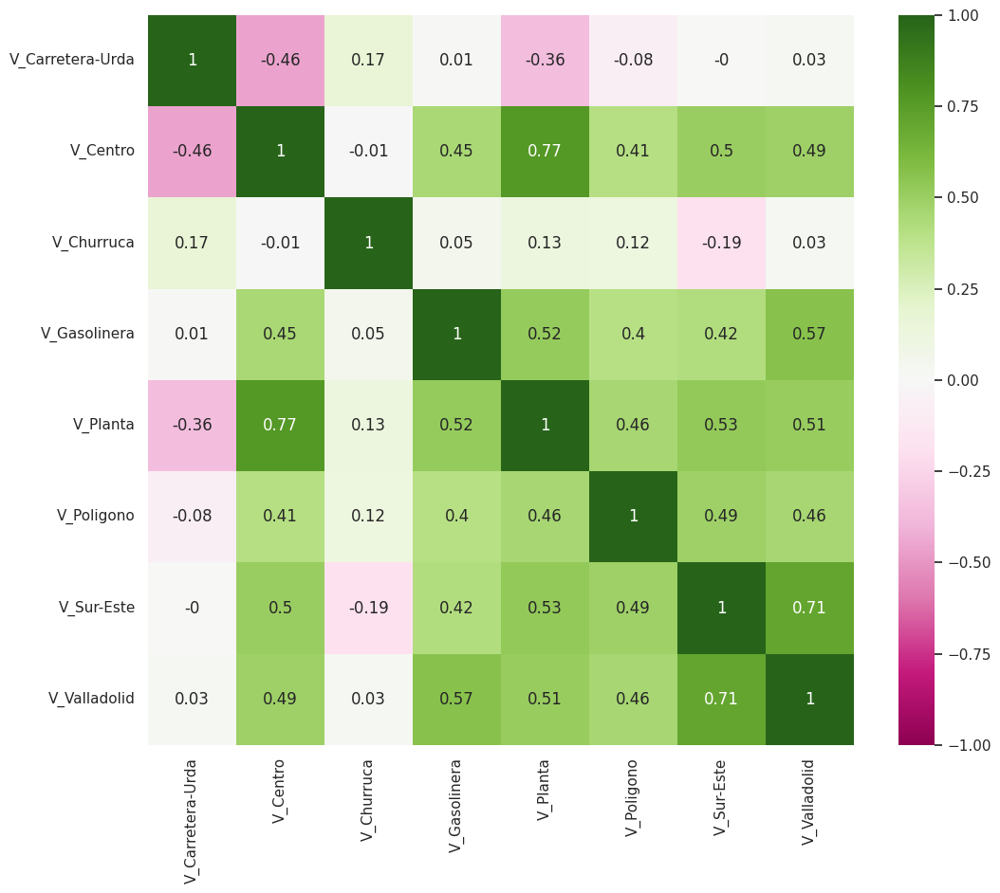

In [101]:
sns.set(rc={'figure.figsize':(12,10)})
cols = list(range(3,11))
df_corr = df_encshift.iloc[:,cols].copy()
r = df_corr.corr()
sns.heatmap(r.round(2), vmin=-1, vmax=1, annot=True, cmap="PiYG")

<Axes: >

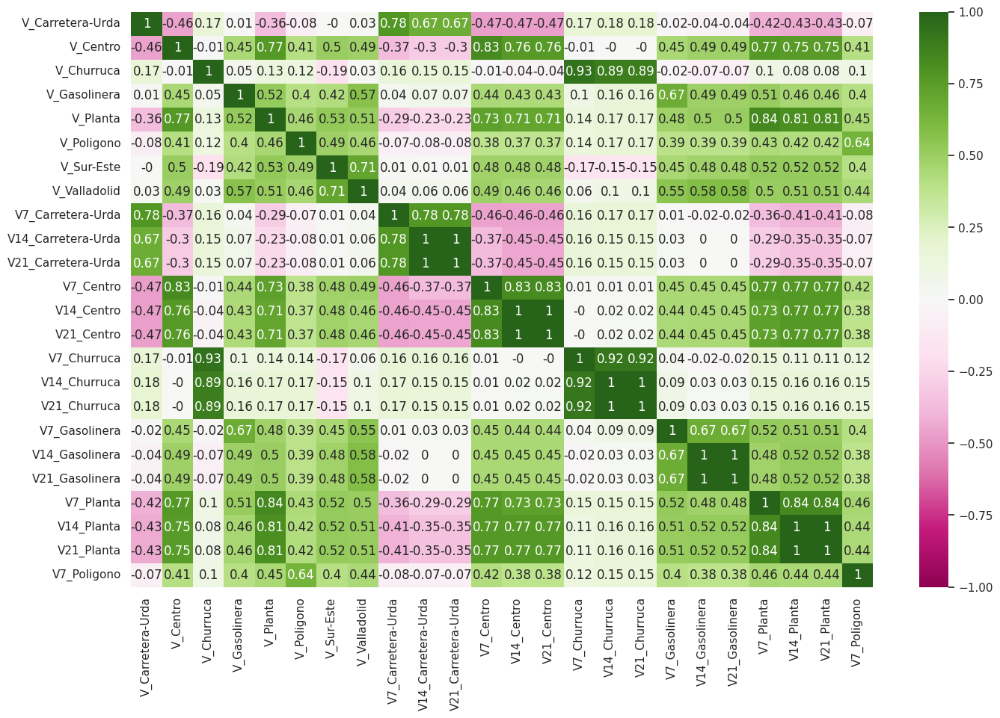

In [102]:
sns.set(rc={'figure.figsize':(16,10)})
cols = list(range(3,11)) + list(range(33,49))
df_corr = df_encshift.iloc[:,cols].copy()
r = df_corr.corr()
sns.heatmap(r.round(2), vmin=-1, vmax=1, annot=True, cmap="PiYG")

<Axes: >

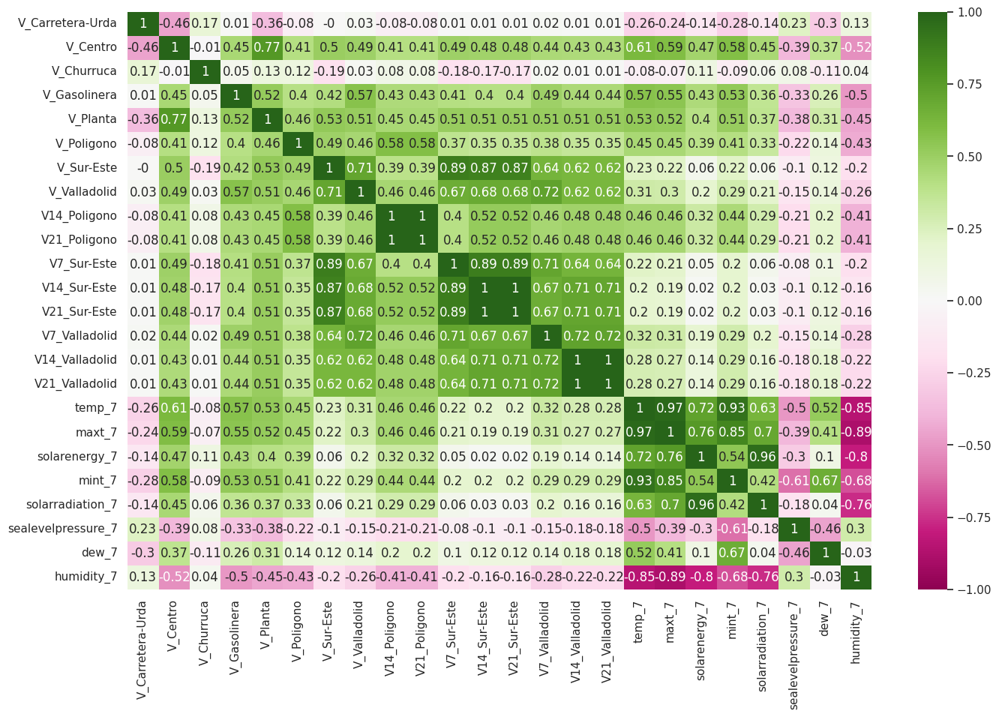

In [103]:
sns.set(rc={'figure.figsize':(16,10)})
cols = list(range(3,11)) + list(range(49,65))
df_corr = df_encshift.iloc[:,cols].copy()
r = df_corr.corr()
sns.heatmap(r.round(2), vmin=-1, vmax=1, annot=True, cmap="PiYG")

In [ ]:
df_encshift.columns

Index(['RowKey', 'RowKey_Date', 'RowKey_Time', 'V_Carretera-Urda', 'V_Centro',
       'V_Churruca', 'V_Gasolinera', 'V_Planta', 'V_Poligono', 'V_Sur-Este',
       'V_Valladolid', 'DiaSem_Domingo', 'DiaSem_Jueves', 'DiaSem_Lunes',
       'DiaSem_Martes', 'DiaSem_Miercoles', 'DiaSem_Sabado', 'DiaSem_Viernes',
       'Clasif_Lab_Laborable', 'Clasif_Lab_No Laborable',
       'Clasif_Fest_Festivo', 'Clasif_Fest_No Festivo', 'N_DiaMes', 'N_Mes',
       'N_Ano', 'Lab_PrevioFest', 'Lab_PostFest', 'DiaSem_SIN', 'DiaSem_COS',
       'Dia_SIN', 'Dia_COS', 'Mes_SIN', 'Mes_COS', 'V7_Carretera-Urda',
       'V14_Carretera-Urda', 'V7_Centro', 'V14_Centro', 'V7_Churruca',
       'V14_Churruca', 'V7_Gasolinera', 'V14_Gasolinera', 'V7_Planta',
       'V14_Planta', 'V7_Poligono', 'V14_Poligono', 'V7_Sur-Este',
       'V14_Sur-Este', 'V7_Valladolid', 'V14_Valladolid', 'wdir_7', 'temp_7',
       'maxt_7', 'visibility_7', 'wspd_7', 'solarenergy_7', 'mint_7',
       'precip_7', 'solarradiation_7', 'sealevelp

In [ ]:
sel_cols = ['V_Carretera-Urda', 'V_Centro', 'V_Churruca', 'V_Gasolinera', 'V_Planta', 'V_Poligono', 'V_Sur-Este', 'V_Valladolid',
            'V7_Carretera-Urda', 'V7_Centro', 'V7_Churruca', 'V7_Gasolinera', 'V7_Planta', 'V7_Poligono', 'V7_Sur-Este', 'V7_Valladolid',
            'wdir_7', 'temp_7', 'maxt_7', 'visibility_7', 'solarenergy_7', 'mint_7', 'solarradiation_7', 'sealevelpressure_7', 'dew_7', 'humidity_7',
            'N_Mes', 'N_Ano', 'Mes_SIN', 'Mes_COS']

In [ ]:
#df_sel = df_encshift[sel_cols].copy()
#df_sel

,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,V_Valladolid,V7_Carretera-Urda,V7_Centro,...,solarenergy_7,mint_7,solarradiation_7,sealevelpressure_7,dew_7,humidity_7,N_Mes,N_Ano,Mes_SIN,Mes_COS
0,1.0200,1.7812,11.1250,1.0900,2.4531,1.7251,5.5625,9.6875,0.4399,1.7500,...,25.0000,15.2000,463.1000,"1,014.5000",11.8000,46.6400,8,2021,-0.5000,-0.8660
1,0.9199,1.5625,11.0000,1.1100,2.5156,1.8049,5.7500,9.9375,0.5200,1.8125,...,25.0000,15.2000,463.1000,"1,014.5000",11.8000,46.6400,8,2021,-0.5000,-0.8660
2,0.9502,1.5312,10.0000,1.1800,2.4375,1.7511,5.2500,9.5625,0.3901,1.5937,...,25.0000,15.2000,463.1000,"1,014.5000",11.8000,46.6400,8,2021,-0.5000,-0.8660
3,0.8901,1.5000,9.3750,0.9700,2.1719,1.7725,4.8750,8.8125,0.4302,1.4375,...,25.0000,15.2000,463.1000,"1,014.5000",11.8000,46.6400,8,2021,-0.5000,-0.8660
4,0.8599,1.5312,9.1250,0.9400,2.0781,1.6115,4.5625,8.3750,0.3599,1.4375,...,25.0000,15.2000,463.1000,"1,014.5000",11.8000,46.6400,8,2021,-0.5000,-0.8660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46391,0.1504,1.2891,0.8026,0.5800,1.5898,0.0025,6.3750,7.1992,0.1504,1.1016,...,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100,12,2022,-0.5000,0.8660
46392,0.1568,1.2268,0.5308,0.5900,1.6428,0.3573,6.8750,7.4638,0.1602,1.1680,...,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100,12,2022,-0.5000,0.8660
46393,0.1553,1.2660,0.5320,0.6700,1.7458,0.4748,7.2500,8.1185,0.1484,1.2422,...,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100,12,2022,-0.5000,0.8660
46394,0.1624,1.2557,1.4712,0.7200,1.9044,0.5197,8.2500,9.3019,0.1602,1.2188,...,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100,12,2022,-0.5000,0.8660


<Axes: >

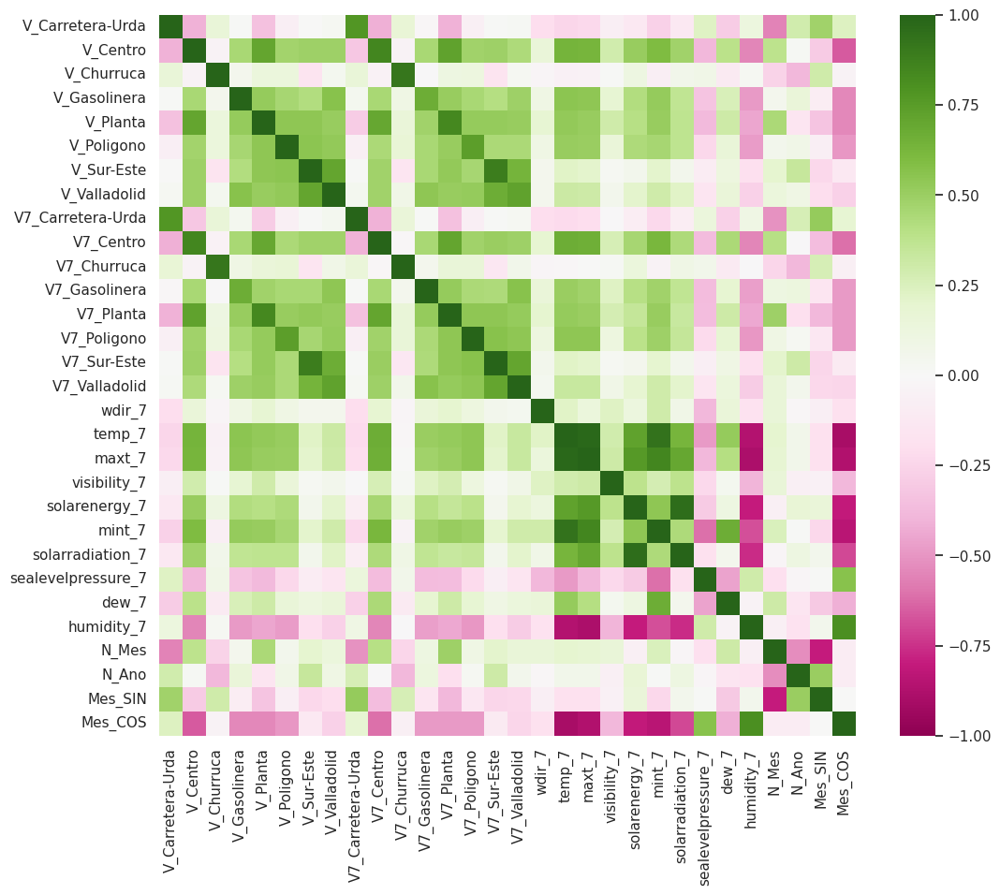

In [ ]:
sns.set(rc={'figure.figsize':(12,10)})
df_corr = df_sel.copy()
r = df_corr.corr()
sns.heatmap(r.round(2), vmin=-1, vmax=1, annot=False, cmap="PiYG")

## 2. ML MODEL: XGBOOST

### Target & Predictor variables

In [227]:
df_model = df_encshift.copy()
df_model

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,V14_Valladolid,V21_Valladolid,temp_7,maxt_7,solarenergy_7,mint_7,solarradiation_7,sealevelpressure_7,dew_7,humidity_7
0,2021-08-23 00:15:00+00:00,2021-08-23,00:15:00,0.3599,2.0000,11.5000,1.2300,3.0938,1.2925,4.8125,...,9.7500,9.7500,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
1,2021-08-23 00:30:00+00:00,2021-08-23,00:30:00,0.3799,1.8438,11.0000,1.2800,2.8750,1.2925,4.9375,...,9.3125,9.3125,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
2,2021-08-23 00:45:00+00:00,2021-08-23,00:45:00,0.7500,1.7500,10.5000,1.0700,2.7188,1.2925,4.5000,...,8.9375,8.9375,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
3,2021-08-23 01:00:00+00:00,2021-08-23,01:00:00,0.3901,1.5938,9.8750,1.1100,2.5000,1.2925,4.4375,...,8.3750,8.3750,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
4,2021-08-23 01:15:00+00:00,2021-08-23,01:15:00,0.3398,1.8438,9.1875,1.0900,2.1250,1.6625,4.4375,...,8.3125,8.3125,31.8000,38.7000,24.9000,21.8000,493.9000,"1,015.4000",-4.7000,10.4900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45719,2022-12-12 06:00:00+00:00,2022-12-12,06:00:00,0.1504,1.2891,0.0000,0.5800,1.5898,0.0025,6.3750,...,8.3008,8.3008,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45720,2022-12-12 06:15:00+00:00,2022-12-12,06:15:00,0.1547,1.2786,0.0000,0.5900,1.6360,0.2955,6.8750,...,8.9023,8.9023,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45721,2022-12-12 06:30:00+00:00,2022-12-12,06:30:00,0.1553,1.3128,0.0000,0.6700,1.7155,0.5057,7.2500,...,9.2969,9.2969,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100
45722,2022-12-12 06:45:00+00:00,2022-12-12,06:45:00,0.1562,1.2463,0.0000,0.7200,2.0370,0.6889,8.2500,...,10.1016,10.1016,8.9000,11.6000,2.3000,4.0000,63.2000,"1,012.0000",8.1000,94.9100


In [228]:
target_cols = [x for x in list(df_model.columns) if x.startswith('V_')]
#target_cols = list(set(target_cols) - set(untarget_cols))
target_cols

['V_Carretera-Urda',
 'V_Centro',
 'V_Churruca',
 'V_Gasolinera',
 'V_Planta',
 'V_Poligono',
 'V_Sur-Este',
 'V_Valladolid']

In [229]:
#filter_list = ''

In [230]:
unselect_comvars = []

try:
  print(filter_list[0])

except:
  filter_list = []
  print('"filter_dict" created')


DiaSem_Domingo


In [231]:

data_cols = list(df_model.columns)
cat_vars = list(df_model.select_dtypes(exclude=["number"]).columns)

del_cols = list(target_cols + unselect_comvars + filter_list + cat_vars)
select_vars = [x for x in list(df_model.columns) if x not in del_cols]
select_vars

print(select_vars)


['N_DiaMes', 'N_Mes', 'N_Ano', 'Dia_SIN', 'Mes_SIN', 'Mes_COS', 'V7_Centro', 'V7_Churruca', 'V14_Churruca', 'V7_Gasolinera', 'V14_Gasolinera', 'V7_Planta', 'V7_Sur-Este', 'V14_Sur-Este', 'V7_Valladolid', 'temp_7', 'solarenergy_7']


### Test dates

In [232]:

#start_date = dt.date(2022, 12, 1)
start_date = dt.date(2022, 12, 3)
end_date = dt.date(2022, 12, 3)    # perhaps date.now()
delta = end_date - start_date   # returns timedelta

test_dates = []
i = 0

for x in range(delta.days + 1):
  day = start_date + dt.timedelta(days=x)
  test_dates.append(str(day))

test_dates[:5]


['2022-12-03']

### Model definition

In [233]:
ML_model = XGBRegressor(nthread=-1, verbosity=1)  # objective='reg:tweedie' # n_estimators=100, max_depth=6, eta=0.3

In [234]:
train_dict = {}
test_dict = {}

for y in test_dates:

  train_dict[y] = {}
  test_dict[y] = {}

  print('\n')
  print(f'Model XGBoost (Test "{y}")')
  print('_'*70)

  day = dt.datetime.strptime(y, '%Y-%m-%d')
  y7 = str(day + dt.timedelta(days=6))

  start = time.time()

  X_train = df_model[(df_model['RowKey_Date']<y)][select_vars]
  y_train = df_model[(df_model['RowKey_Date']<y)][target_cols].copy()
  y_train.reset_index(drop=True, inplace=True)
  #y_train.rename("y_true", inplace=True)

  X_test = df_model[(df_model['RowKey_Date']>=y)&(df_model['RowKey_Date']<=y7)][select_vars]
  y_test = df_model[(df_model['RowKey_Date']>=y)&(df_model['RowKey_Date']<=y7)][target_cols].copy()
  y_test.reset_index(drop=True, inplace=True)
  #y_test.rename("y_true", inplace=True)

  ML_model.fit(X_train, y_train)
  y_trainpred = pd.DataFrame(ML_model.predict(X_train), columns=[x.replace('V_','PredV_') for x in target_cols])
  for k, v in y_trainpred.items():
    v[v < 0] = 0
  #y_trainpred[y_trainpred<0] = 0
  y_testpred = pd.DataFrame(ML_model.predict(X_test), columns=[x.replace('V_','PredV_') for x in target_cols])
  for k, v in y_testpred.items():
    v[v < 0] = 0
  #y_testpred[y_testpred<0] = 0

  df_auxtrain = df_model[(df_model['RowKey_Date']<y)][['RowKey','RowKey_Date','RowKey_Time']].copy()
  df_auxtrain.reset_index(drop=True, inplace=True)
  train_res = pd.concat([df_auxtrain, y_train, y_trainpred], axis=1)
  df_auxtest = df_model[(df_model['RowKey_Date']>=y)&(df_model['RowKey_Date']<=y7)][['RowKey','RowKey_Date','RowKey_Time']].copy()
  df_auxtest.reset_index(drop=True, inplace=True)
  test_res = pd.concat([df_auxtest, y_test, y_testpred], axis=1).reset_index(drop=True)
  train_dict[y] = train_res
  test_dict[y] = test_res

  df_aux = pd.DataFrame(columns=['RowKey_Date'])
  #df_aux = pd.DataFrame(columns=cols)
  df_aux = pd.concat([df_aux, pd.DataFrame(ML_model.feature_importances_, index=select_vars).transpose()], axis=1)
  #df_aux.loc[:,'STA_Label'] = x
  df_aux.loc[:,'RowKey_Date'] = y

  if test_dates.index(y)==0:
    imp_df = df_aux.copy()
  else:
    imp_df = pd.concat([imp_df, df_aux], axis=0)
    #imp_df = pd.concat([imp_df, df_aux], axis=0)
    imp_df.reset_index(drop=True,inplace=True)
    imp_df

  end = time.time()
  #print('_'*35)
  print(f'-Train/Test completed ({timedelta(minutes=end-start)}))')
  #print('\n')




Model XGBoost (Test "2022-12-03")
______________________________________________________________________
-Train/Test completed (0:05:34.437146))


In [235]:
train_dict.keys()

dict_keys(['2022-12-03'])

In [236]:
train_dict['2022-12-03']

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,V_Valladolid,PredV_Carretera-Urda,PredV_Centro,PredV_Churruca,PredV_Gasolinera,PredV_Planta,PredV_Poligono,PredV_Sur-Este,PredV_Valladolid
0,2021-08-23 00:15:00+00:00,2021-08-23,00:15:00,0.3599,2.0000,11.5000,1.2300,3.0938,1.2925,4.8125,9.3125,0.4263,2.0493,11.3214,1.1307,3.0975,1.3598,5.0944,9.6820
1,2021-08-23 00:30:00+00:00,2021-08-23,00:30:00,0.3799,1.8438,11.0000,1.2800,2.8750,1.2925,4.9375,9.3125,0.5041,1.8561,11.2219,1.1733,3.0633,1.6479,5.2594,9.5103
2,2021-08-23 00:45:00+00:00,2021-08-23,00:45:00,0.7500,1.7500,10.5000,1.0700,2.7188,1.2925,4.5000,8.5000,0.4987,1.7411,10.4066,1.2324,2.7225,1.5431,4.6161,8.6824
3,2021-08-23 01:00:00+00:00,2021-08-23,01:00:00,0.3901,1.5938,9.8750,1.1100,2.5000,1.2925,4.4375,8.5000,0.3249,1.7527,9.9906,1.0257,2.5651,1.5067,4.4857,8.4832
4,2021-08-23 01:15:00+00:00,2021-08-23,01:15:00,0.3398,1.8438,9.1875,1.0900,2.1250,1.6625,4.4375,8.3125,0.3166,1.7063,9.6897,1.0100,2.3282,1.3999,4.3175,8.1682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44827,2022-12-02 23:00:00+00:00,2022-12-02,23:00:00,0.1602,1.8086,0.0000,1.0700,2.4609,0.6550,8.6250,10.4023,0.2056,1.8090,0.0005,1.0613,2.9766,0.6559,8.8156,10.7777
44828,2022-12-02 23:15:00+00:00,2022-12-02,23:15:00,0.2109,1.7695,0.0000,0.9400,2.3086,0.4950,8.5000,10.0977,0.2042,1.7692,0.0021,0.9906,2.7634,0.7082,8.8316,10.2951
44829,2022-12-02 23:30:00+00:00,2022-12-02,23:30:00,0.1992,1.7500,0.0000,0.8900,2.3125,0.4950,8.2500,9.6992,0.1661,1.6592,0.0000,0.9603,2.7689,0.6833,8.1661,10.0905
44830,2022-12-02 23:45:00+00:00,2022-12-02,23:45:00,0.2012,1.6719,0.0000,0.8400,2.0781,0.4950,7.7500,9.1016,0.1995,1.7896,0.0021,1.0059,2.4054,0.6271,8.0429,9.7233


In [237]:
test_dict.keys()

dict_keys(['2022-12-03'])

In [238]:
test_dict['2022-12-03']

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,V_Valladolid,PredV_Carretera-Urda,PredV_Centro,PredV_Churruca,PredV_Gasolinera,PredV_Planta,PredV_Poligono,PredV_Sur-Este,PredV_Valladolid
0,2022-12-03 00:15:00+00:00,2022-12-03,00:15:00,0.1602,1.6797,0.1138,0.7400,2.0391,0.4925,6.7500,7.8984,0.1058,1.5152,0.0000,0.7813,2.3889,1.4564,7.3950,9.0354
1,2022-12-03 00:30:00+00:00,2022-12-03,00:30:00,0.1816,1.5820,0.1975,0.6700,1.9102,0.4925,7.1250,8.1992,0.0679,1.4875,0.0000,0.6810,2.1656,1.4006,7.0145,9.1035
2,2022-12-03 00:45:00+00:00,2022-12-03,00:45:00,0.1484,1.4102,0.1975,0.6900,1.9492,0.4925,7.0000,7.9023,0.0787,1.4274,0.0000,0.5258,1.8171,1.4354,6.9958,8.0315
3,2022-12-03 01:00:00+00:00,2022-12-03,01:00:00,0.1602,1.3711,0.1975,0.6800,1.9492,0.4925,6.8750,7.6992,0.1156,1.2602,0.1317,0.4979,1.8624,1.4213,6.9335,8.0032
4,2022-12-03 01:15:00+00:00,2022-12-03,01:15:00,0.2012,1.3281,0.1975,0.6200,1.8828,0.5000,6.7500,7.5977,0.1183,1.4856,0.1056,0.5122,1.8847,1.3940,6.9476,8.0406
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,2022-12-09 23:00:00+00:00,2022-12-09,23:00:00,0.2207,1.6211,0.0000,0.9600,2.5078,0.6000,8.8750,10.6016,0.1130,1.9093,0.8162,1.0049,2.3482,1.5091,8.8989,10.4104
668,2022-12-09 23:15:00+00:00,2022-12-09,23:15:00,0.2793,1.8906,0.0000,0.8800,2.8984,0.4100,8.6250,10.3984,0.0962,1.8088,0.8179,0.9000,2.1856,1.6802,9.1355,9.9309
669,2022-12-09 23:30:00+00:00,2022-12-09,23:30:00,0.1602,1.8477,0.0000,0.9300,2.5508,0.4100,8.2500,10.0000,0.1023,1.6197,0.7699,1.1162,2.1688,1.4067,8.2467,9.7418
670,2022-12-09 23:45:00+00:00,2022-12-09,23:45:00,0.1797,1.6797,0.0000,0.7600,2.4023,0.4100,8.2500,9.3984,0.0562,1.4884,0.5289,0.8187,1.8645,1.3902,7.5710,9.1814


In [239]:
imp_df

,RowKey_Date,N_DiaMes,N_Mes,N_Ano,Dia_SIN,Mes_SIN,Mes_COS,V7_Centro,V7_Churruca,V14_Churruca,V7_Gasolinera,V14_Gasolinera,V7_Planta,V7_Sur-Este,V14_Sur-Este,V7_Valladolid,temp_7,solarenergy_7
0,2022-12-03,0.0165,0.0443,0.1821,0.0204,0.0094,0.0469,0.0104,0.3833,0.0084,0.0101,0.0243,0.0338,0.0456,0.0348,0.1107,0.0126,0.0065


### Feature importance

In [240]:
cols = [x for x in list(df_model.columns) if x in list(imp_df.columns)]
imp_df = imp_df[cols]
imp_df

,RowKey_Date,N_DiaMes,N_Mes,N_Ano,Dia_SIN,Mes_SIN,Mes_COS,V7_Centro,V7_Churruca,V14_Churruca,V7_Gasolinera,V14_Gasolinera,V7_Planta,V7_Sur-Este,V14_Sur-Este,V7_Valladolid,temp_7,solarenergy_7
0,2022-12-03,0.0165,0.0443,0.1821,0.0204,0.0094,0.0469,0.0104,0.3833,0.0084,0.0101,0.0243,0.0338,0.0456,0.0348,0.1107,0.0126,0.0065


In [241]:
imp_df.iloc[:,range(0,15)]

,RowKey_Date,N_DiaMes,N_Mes,N_Ano,Dia_SIN,Mes_SIN,Mes_COS,V7_Centro,V7_Churruca,V14_Churruca,V7_Gasolinera,V14_Gasolinera,V7_Planta,V7_Sur-Este,V14_Sur-Este
0,2022-12-03,0.0165,0.0443,0.1821,0.0204,0.0094,0.0469,0.0104,0.3833,0.0084,0.0101,0.0243,0.0338,0.0456,0.0348


In [242]:
#imp_df.iloc[:,list(range(0,1))+list(range(15,23))]

In [243]:
#mant_cols = [x.replace('V_','V7_') for x in target_cols] + [x.replace('V_','V14_') for x in target_cols] + [x.replace('V_','V21_') for x in target_cols]
mant_cols = []

pred_cols = [x for x in list(imp_df.columns) if (x!='RowKey_Date') and (x not in mant_cols)]

for y in pred_cols:
  imp_value = imp_df[y].mean()

  if imp_value < 0.006:
    filter_list.append(y)


In [244]:
filter_list

['DiaSem_Domingo',
 'DiaSem_Jueves',
 'DiaSem_Lunes',
 'DiaSem_Martes',
 'DiaSem_Miercoles',
 'DiaSem_Sabado',
 'DiaSem_Viernes',
 'Clasif_Lab_Laborable',
 'Clasif_Lab_No Laborable',
 'Clasif_Fest_Festivo',
 'Clasif_Fest_No Festivo',
 'Lab_PrevioFest',
 'Lab_PostFest',
 'DiaSem_SIN',
 'DiaSem_COS',
 'Dia_COS',
 'V7_Carretera-Urda',
 'V14_Carretera-Urda',
 'V21_Carretera-Urda',
 'V14_Centro',
 'V21_Centro',
 'V21_Churruca',
 'V21_Gasolinera',
 'V14_Planta',
 'V21_Planta',
 'V7_Poligono',
 'V14_Poligono',
 'V21_Poligono',
 'V21_Sur-Este',
 'V14_Valladolid',
 'V21_Valladolid',
 'maxt_7',
 'mint_7',
 'solarradiation_7',
 'sealevelpressure_7',
 'dew_7',
 'humidity_7']

### Train/Test scores

In [245]:
train_dict.keys()

dict_keys(['2022-12-03'])

In [246]:
train_dict['2022-12-03']

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,V_Valladolid,PredV_Carretera-Urda,PredV_Centro,PredV_Churruca,PredV_Gasolinera,PredV_Planta,PredV_Poligono,PredV_Sur-Este,PredV_Valladolid
0,2021-08-23 00:15:00+00:00,2021-08-23,00:15:00,0.3599,2.0000,11.5000,1.2300,3.0938,1.2925,4.8125,9.3125,0.4263,2.0493,11.3214,1.1307,3.0975,1.3598,5.0944,9.6820
1,2021-08-23 00:30:00+00:00,2021-08-23,00:30:00,0.3799,1.8438,11.0000,1.2800,2.8750,1.2925,4.9375,9.3125,0.5041,1.8561,11.2219,1.1733,3.0633,1.6479,5.2594,9.5103
2,2021-08-23 00:45:00+00:00,2021-08-23,00:45:00,0.7500,1.7500,10.5000,1.0700,2.7188,1.2925,4.5000,8.5000,0.4987,1.7411,10.4066,1.2324,2.7225,1.5431,4.6161,8.6824
3,2021-08-23 01:00:00+00:00,2021-08-23,01:00:00,0.3901,1.5938,9.8750,1.1100,2.5000,1.2925,4.4375,8.5000,0.3249,1.7527,9.9906,1.0257,2.5651,1.5067,4.4857,8.4832
4,2021-08-23 01:15:00+00:00,2021-08-23,01:15:00,0.3398,1.8438,9.1875,1.0900,2.1250,1.6625,4.4375,8.3125,0.3166,1.7063,9.6897,1.0100,2.3282,1.3999,4.3175,8.1682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44827,2022-12-02 23:00:00+00:00,2022-12-02,23:00:00,0.1602,1.8086,0.0000,1.0700,2.4609,0.6550,8.6250,10.4023,0.2056,1.8090,0.0005,1.0613,2.9766,0.6559,8.8156,10.7777
44828,2022-12-02 23:15:00+00:00,2022-12-02,23:15:00,0.2109,1.7695,0.0000,0.9400,2.3086,0.4950,8.5000,10.0977,0.2042,1.7692,0.0021,0.9906,2.7634,0.7082,8.8316,10.2951
44829,2022-12-02 23:30:00+00:00,2022-12-02,23:30:00,0.1992,1.7500,0.0000,0.8900,2.3125,0.4950,8.2500,9.6992,0.1661,1.6592,0.0000,0.9603,2.7689,0.6833,8.1661,10.0905
44830,2022-12-02 23:45:00+00:00,2022-12-02,23:45:00,0.2012,1.6719,0.0000,0.8400,2.0781,0.4950,7.7500,9.1016,0.1995,1.7896,0.0021,1.0059,2.4054,0.6271,8.0429,9.7233


In [247]:
test_dict.keys()

dict_keys(['2022-12-03'])

In [248]:
test_dict['2022-12-03']

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,V_Valladolid,PredV_Carretera-Urda,PredV_Centro,PredV_Churruca,PredV_Gasolinera,PredV_Planta,PredV_Poligono,PredV_Sur-Este,PredV_Valladolid
0,2022-12-03 00:15:00+00:00,2022-12-03,00:15:00,0.1602,1.6797,0.1138,0.7400,2.0391,0.4925,6.7500,7.8984,0.1058,1.5152,0.0000,0.7813,2.3889,1.4564,7.3950,9.0354
1,2022-12-03 00:30:00+00:00,2022-12-03,00:30:00,0.1816,1.5820,0.1975,0.6700,1.9102,0.4925,7.1250,8.1992,0.0679,1.4875,0.0000,0.6810,2.1656,1.4006,7.0145,9.1035
2,2022-12-03 00:45:00+00:00,2022-12-03,00:45:00,0.1484,1.4102,0.1975,0.6900,1.9492,0.4925,7.0000,7.9023,0.0787,1.4274,0.0000,0.5258,1.8171,1.4354,6.9958,8.0315
3,2022-12-03 01:00:00+00:00,2022-12-03,01:00:00,0.1602,1.3711,0.1975,0.6800,1.9492,0.4925,6.8750,7.6992,0.1156,1.2602,0.1317,0.4979,1.8624,1.4213,6.9335,8.0032
4,2022-12-03 01:15:00+00:00,2022-12-03,01:15:00,0.2012,1.3281,0.1975,0.6200,1.8828,0.5000,6.7500,7.5977,0.1183,1.4856,0.1056,0.5122,1.8847,1.3940,6.9476,8.0406
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,2022-12-09 23:00:00+00:00,2022-12-09,23:00:00,0.2207,1.6211,0.0000,0.9600,2.5078,0.6000,8.8750,10.6016,0.1130,1.9093,0.8162,1.0049,2.3482,1.5091,8.8989,10.4104
668,2022-12-09 23:15:00+00:00,2022-12-09,23:15:00,0.2793,1.8906,0.0000,0.8800,2.8984,0.4100,8.6250,10.3984,0.0962,1.8088,0.8179,0.9000,2.1856,1.6802,9.1355,9.9309
669,2022-12-09 23:30:00+00:00,2022-12-09,23:30:00,0.1602,1.8477,0.0000,0.9300,2.5508,0.4100,8.2500,10.0000,0.1023,1.6197,0.7699,1.1162,2.1688,1.4067,8.2467,9.7418
670,2022-12-09 23:45:00+00:00,2022-12-09,23:45:00,0.1797,1.6797,0.0000,0.7600,2.4023,0.4100,8.2500,9.3984,0.0562,1.4884,0.5289,0.8187,1.8645,1.3902,7.5710,9.1814


In [249]:
target_cols[:5]

['V_Carretera-Urda', 'V_Centro', 'V_Churruca', 'V_Gasolinera', 'V_Planta']

In [250]:
test_dates[:5]

['2022-12-03']

In [251]:
y = '2022-12-02'

In [252]:

df_scores = pd.DataFrame(columns=['RowKey_Date', 'Train_MAPE','Train_MAE','Train_RMSE','Test_MAPE','Test_MAE','Test_RMSE'])
i = 0

for y in test_dates:

  df_scores.loc[i,'RowKey_Date'] = y
  true_cols = [x for x in list(train_dict[y].columns) if x.startswith('V_')]
  pred_cols = [x for x in list(train_dict[y].columns) if x.startswith('PredV_')]

  # TRAIN SCORES
  y_true = train_dict[y].loc[:,true_cols]
  y_pred = train_dict[y].loc[:,pred_cols]
  #mape = round(mean_absolute_percentage_error(y_true, y_pred), 4)
  mape = round(mape_corr_multi(y_true, y_pred), 4)
  mae = round(mean_absolute_error(y_true, y_pred), 4)
  rmse = round(mean_squared_error(y_true, y_pred, squared=False), 4)

  df_scores.loc[i,'Train_MAPE'] = mape
  df_scores.loc[i,'Train_MAE'] = mae
  df_scores.loc[i,'Train_RMSE'] = rmse

  # TEST SCORES
  y_true = test_dict[y].loc[:,true_cols]
  y_pred = test_dict[y].loc[:,pred_cols]
  #mape = round(mean_absolute_percentage_error(y_true, y_pred), 4)
  mape = round(mape_corr_multi(y_true, y_pred), 4)
  mae = round(mean_absolute_error(y_true, y_pred), 4)
  rmse = round(mean_squared_error(y_true, y_pred, squared=False), 4)

  df_scores.loc[i,'Test_MAPE'] = mape
  df_scores.loc[i,'Test_MAE'] = mae
  df_scores.loc[i,'Test_RMSE'] = rmse

  i += 1


In [253]:
df_scores

,RowKey_Date,Train_MAPE,Train_MAE,Train_RMSE,Test_MAPE,Test_MAE,Test_RMSE
0,2022-12-03,0,0.2417,0.3833,0,0.4053,0.6828


In [254]:
final_scores = df_scores.iloc[:,range(1,df_scores.shape[1])].mean()
final_scores

Train_MAPE   0.0000
Train_MAE    0.2417
Train_RMSE   0.3833
Test_MAPE    0.0000
Test_MAE     0.4053
Test_RMSE    0.6828
dtype: float64

In [255]:
df_model.iloc[:,range(0,11)].describe()

,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,V_Valladolid
count,"45,724.0000","45,724.0000","45,724.0000","45,724.0000","45,724.0000","45,724.0000","45,724.0000","45,724.0000"
mean,0.4866,1.5791,8.7999,1.5141,2.9265,0.9790,6.7132,9.2966
std,0.7040,1.1072,6.5323,1.0053,2.2075,0.7706,2.4456,4.3382
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0605,0.6948,0.1837,0.8800,1.3125,0.4975,5.1250,6.7500
50%,0.1699,1.7078,9.5631,1.2900,3.0391,0.6800,6.5000,9.1875
75%,0.5117,2.3594,14.0000,1.9500,4.5000,1.2025,8.2500,12.1250
max,4.9800,8.4023,31.5000,8.6100,17.4805,7.2550,37.6250,42.0999


In [256]:

for y in test_dates:

  true_cols = [x for x in list(train_dict[y].columns) if x.startswith('V_')]
  pred_cols = [x for x in list(train_dict[y].columns) if x.startswith('PredV_')]

  df_train = train_dict[y]
  df_test = test_dict[y]

  if test_dates.index(y)==0:
    preds_train = df_train.copy()
    preds_test = df_test.copy()
  else:
    preds_train = pd.concat([preds_train, df_train], axis=0)
    preds_train.reset_index(drop=True,inplace=True)

    preds_test = pd.concat([preds_test, df_test], axis=0)
    preds_test.reset_index(drop=True,inplace=True)

for (i,j) in zip(pred_cols,true_cols):
  col_name = j.replace('V_','Resid_')
  preds_train[col_name] = preds_train[i] - preds_train[j]
  preds_test[col_name] = preds_test[i] - preds_test[j]


In [257]:
preds_train

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,PredV_Sur-Este,PredV_Valladolid,Resid_Carretera-Urda,Resid_Centro,Resid_Churruca,Resid_Gasolinera,Resid_Planta,Resid_Poligono,Resid_Sur-Este,Resid_Valladolid
0,2021-08-23 00:15:00+00:00,2021-08-23,00:15:00,0.3599,2.0000,11.5000,1.2300,3.0938,1.2925,4.8125,...,5.0944,9.6820,0.0664,0.0493,-0.1786,-0.0993,0.0037,0.0673,0.2819,0.3695
1,2021-08-23 00:30:00+00:00,2021-08-23,00:30:00,0.3799,1.8438,11.0000,1.2800,2.8750,1.2925,4.9375,...,5.2594,9.5103,0.1242,0.0124,0.2219,-0.1067,0.1883,0.3554,0.3219,0.1978
2,2021-08-23 00:45:00+00:00,2021-08-23,00:45:00,0.7500,1.7500,10.5000,1.0700,2.7188,1.2925,4.5000,...,4.6161,8.6824,-0.2513,-0.0089,-0.0934,0.1624,0.0037,0.2506,0.1161,0.1824
3,2021-08-23 01:00:00+00:00,2021-08-23,01:00:00,0.3901,1.5938,9.8750,1.1100,2.5000,1.2925,4.4375,...,4.4857,8.4832,-0.0652,0.1590,0.1156,-0.0843,0.0651,0.2142,0.0482,-0.0168
4,2021-08-23 01:15:00+00:00,2021-08-23,01:15:00,0.3398,1.8438,9.1875,1.0900,2.1250,1.6625,4.4375,...,4.3175,8.1682,-0.0232,-0.1374,0.5022,-0.0800,0.2032,-0.2626,-0.1200,-0.1443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44827,2022-12-02 23:00:00+00:00,2022-12-02,23:00:00,0.1602,1.8086,0.0000,1.0700,2.4609,0.6550,8.6250,...,8.8156,10.7777,0.0455,0.0005,0.0005,-0.0087,0.5156,0.0009,0.1906,0.3754
44828,2022-12-02 23:15:00+00:00,2022-12-02,23:15:00,0.2109,1.7695,0.0000,0.9400,2.3086,0.4950,8.5000,...,8.8316,10.2951,-0.0068,-0.0004,0.0021,0.0506,0.4548,0.2132,0.3316,0.1974
44829,2022-12-02 23:30:00+00:00,2022-12-02,23:30:00,0.1992,1.7500,0.0000,0.8900,2.3125,0.4950,8.2500,...,8.1661,10.0905,-0.0331,-0.0908,0.0000,0.0703,0.4564,0.1883,-0.0839,0.3913
44830,2022-12-02 23:45:00+00:00,2022-12-02,23:45:00,0.2012,1.6719,0.0000,0.8400,2.0781,0.4950,7.7500,...,8.0429,9.7233,-0.0016,0.1178,0.0021,0.1659,0.3273,0.1321,0.2929,0.6217


In [258]:
resid_cols = [x for x in list(preds_train.columns) if x.startswith('Resid_')]
resid_train = pd.DataFrame()

for x in resid_cols:
  df_aux = preds_train[(preds_train[x]<-10)|(preds_train[x]>10)].copy()
  resid_train = pd.concat([resid_train,df_aux], axis=0)

resid_train

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,PredV_Sur-Este,PredV_Valladolid,Resid_Carretera-Urda,Resid_Centro,Resid_Churruca,Resid_Gasolinera,Resid_Planta,Resid_Poligono,Resid_Sur-Este,Resid_Valladolid
41592,2022-10-30 06:15:00+00:00,2022-10-30,06:15:00,0.1992,1.6719,0.0725,0.5700,1.5898,0.5750,37.6250,...,20.5860,8.7977,0.0095,0.1105,0.1066,-0.0382,-0.0429,0.2855,-17.0390,-0.2023
10230,2021-12-07 13:45:00+00:00,2021-12-07,13:45:00,0.0400,1.6826,0.0000,1.0700,0.0000,1.0625,6.6875,...,6.3392,13.2820,0.0387,-0.3426,5.7239,-0.0341,1.8466,-0.1645,-0.3483,-10.2180
10231,2021-12-07 14:00:00+00:00,2021-12-07,14:00:00,0.0195,1.6162,0.0000,0.9000,0.0000,1.0625,6.3125,...,5.9526,13.7046,0.0744,-0.3482,7.8467,0.0642,2.5543,-0.1245,-0.3599,-13.2954
10232,2021-12-07 14:15:00+00:00,2021-12-07,14:15:00,0.0903,1.7149,0.0000,0.9100,0.0000,1.2375,6.1875,...,5.8678,11.1583,0.0168,-0.5493,7.7450,-0.0001,2.4373,-0.4645,-0.3197,-13.0292
10235,2021-12-07 15:00:00+00:00,2021-12-07,15:00:00,0.0996,1.7737,0.0000,1.1400,0.0000,1.2375,6.6875,...,6.3606,13.3115,-0.0361,-0.5360,6.5864,-0.0842,1.9394,-0.3656,-0.3269,-10.1885
40735,2022-10-21 08:00:00+00:00,2022-10-21,08:00:00,0.1309,2.9570,0.0000,1.3000,4.3906,0.7175,10.5000,...,9.9722,2.8986,0.0880,-0.4506,0.0000,-0.1717,0.1726,-0.1815,-0.5278,-10.6014
41588,2022-10-30 05:15:00+00:00,2022-10-30,05:15:00,0.9805,8.4023,0.1975,0.4600,6.6914,0.7600,7.3750,...,7.6059,20.1101,-0.6425,-2.5950,-0.0072,0.0743,-5.1515,0.0077,0.2309,-21.9898


In [259]:
preds_test

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,PredV_Sur-Este,PredV_Valladolid,Resid_Carretera-Urda,Resid_Centro,Resid_Churruca,Resid_Gasolinera,Resid_Planta,Resid_Poligono,Resid_Sur-Este,Resid_Valladolid
0,2022-12-03 00:15:00+00:00,2022-12-03,00:15:00,0.1602,1.6797,0.1138,0.7400,2.0391,0.4925,6.7500,...,7.3950,9.0354,-0.0543,-0.1645,-0.1138,0.0413,0.3498,0.9639,0.6450,1.1370
1,2022-12-03 00:30:00+00:00,2022-12-03,00:30:00,0.1816,1.5820,0.1975,0.6700,1.9102,0.4925,7.1250,...,7.0145,9.1035,-0.1138,-0.0945,-0.1975,0.0110,0.2554,0.9081,-0.1105,0.9042
2,2022-12-03 00:45:00+00:00,2022-12-03,00:45:00,0.1484,1.4102,0.1975,0.6900,1.9492,0.4925,7.0000,...,6.9958,8.0315,-0.0698,0.0173,-0.1975,-0.1642,-0.1321,0.9429,-0.0042,0.1292
3,2022-12-03 01:00:00+00:00,2022-12-03,01:00:00,0.1602,1.3711,0.1975,0.6800,1.9492,0.4925,6.8750,...,6.9335,8.0032,-0.0446,-0.1108,-0.0658,-0.1821,-0.0868,0.9288,0.0585,0.3040
4,2022-12-03 01:15:00+00:00,2022-12-03,01:15:00,0.2012,1.3281,0.1975,0.6200,1.8828,0.5000,6.7500,...,6.9476,8.0406,-0.0829,0.1575,-0.0919,-0.1078,0.0019,0.8940,0.1976,0.4429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,2022-12-09 23:00:00+00:00,2022-12-09,23:00:00,0.2207,1.6211,0.0000,0.9600,2.5078,0.6000,8.8750,...,8.8989,10.4104,-0.1077,0.2882,0.8162,0.0449,-0.1596,0.9091,0.0239,-0.1912
668,2022-12-09 23:15:00+00:00,2022-12-09,23:15:00,0.2793,1.8906,0.0000,0.8800,2.8984,0.4100,8.6250,...,9.1355,9.9309,-0.1831,-0.0819,0.8179,0.0200,-0.7128,1.2702,0.5105,-0.4675
669,2022-12-09 23:30:00+00:00,2022-12-09,23:30:00,0.1602,1.8477,0.0000,0.9300,2.5508,0.4100,8.2500,...,8.2467,9.7418,-0.0579,-0.2280,0.7699,0.1862,-0.3820,0.9967,-0.0033,-0.2582
670,2022-12-09 23:45:00+00:00,2022-12-09,23:45:00,0.1797,1.6797,0.0000,0.7600,2.4023,0.4100,8.2500,...,7.5710,9.1814,-0.1235,-0.1913,0.5289,0.0587,-0.5378,0.9802,-0.6790,-0.2170


In [260]:
resid_cols = [x for x in list(preds_test.columns) if x.startswith('Resid_')]
resid_test = pd.DataFrame()

for x in resid_cols:
  df_aux = preds_test[(preds_test[x]<-10)|(preds_test[x]>10)].copy()
  resid_test = pd.concat([resid_test,df_aux], axis=0)

resid_test

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,PredV_Sur-Este,PredV_Valladolid,Resid_Carretera-Urda,Resid_Centro,Resid_Churruca,Resid_Gasolinera,Resid_Planta,Resid_Poligono,Resid_Sur-Este,Resid_Valladolid


In [261]:
true_cols = [x for x in list(train_dict[y].columns) if x.startswith('V_')]
pred_cols = [x for x in list(train_dict[y].columns) if x.startswith('PredV_')]


Train_MAPE = mape_corr_multi(preds_train[true_cols], preds_train[pred_cols])*100
Train_MAE = mean_absolute_error(preds_train[true_cols], preds_train[pred_cols])
Train_RMSE = mean_squared_error(preds_train[true_cols], preds_train[pred_cols], squared=False)

Test_MAPE = mape_corr_multi(preds_test[true_cols], preds_test[pred_cols])*100
Test_MAE = mean_absolute_error(preds_test[true_cols], preds_test[pred_cols])
Test_RMSE = mean_squared_error(preds_test[true_cols], preds_test[pred_cols], squared=False)

In [262]:
mean_absolute_percentage_error(preds_train[true_cols], preds_train[pred_cols])*100

2714577481312713.5

In [ ]:
Test_MAPE = mape_corr_multi(preds_test[true_cols], preds_test[pred_cols])*100

## 4. METRICS

In [263]:
print('Train scores:')
print(f'MAPE = {Train_MAPE:.4f} %')
print(f'MAE = {Train_MAE:.4f}')
print(f'RMSE = {Train_RMSE:.4f}')

print('Test scores:')
print(f'MAPE = {Test_MAPE:.4f} %')
print(f'MAE = {Test_MAE:.4f}')
print(f'RMSE = {Test_RMSE:.4f}')

Train scores:
MAPE = 0.0000 %
MAE = 0.2417
RMSE = 0.3833
Test scores:
MAPE = 0.0000 %
MAE = 0.4053
RMSE = 0.6828


In [ ]:
print('Train scores:')
print(f'MAPE = {Train_MAPE:.4f} %')
print(f'MAE = {Train_MAE:.4f}')
print(f'RMSE = {Train_RMSE:.4f}')

print('Test scores:')
print(f'MAPE = {Test_MAPE:.4f} %')
print(f'MAE = {Test_MAE:.4f}')
print(f'RMSE = {Test_RMSE:.4f}')

Train scores:
MAPE = 0.0000 %
MAE = 0.2342
RMSE = 0.3718
Test scores:
MAPE = 0.0000 %
MAE = 0.3386
RMSE = 0.5744


### Test results preparation

In [ ]:
file_path = '/content/GDrive/MyDrive/IE - Datathon 2023/01_Data/Datos IE/caudales.csv'

In [ ]:
df1 = pd.read_csv(file_path)
df1

,Canonical,RowKey,INF_Label,INF_Value,STA_Label,Sector_Neta
0,DEPOSITO,2021-08-01T00:15:00.000Z,CO:Nivel Deposito %,86.0679,88001 Deposito,22880010
1,DEPOSITO,2021-08-01T00:30:00.000Z,CO:Nivel Deposito %,86.2401,88001 Deposito,22880010
2,DEPOSITO,2021-08-01T00:45:00.000Z,CO:Nivel Deposito %,86.4208,88001 Deposito,22880010
3,DEPOSITO,2021-08-01T01:00:00.000Z,CO:Nivel Deposito %,86.7652,88001 Deposito,22880010
4,DEPOSITO,2021-08-01T01:15:00.000Z,CO:Nivel Deposito %,86.9373,88001 Deposito,22880010
...,...,...,...,...,...,...
1024222,DEPOSITO,2022-12-12T08:00:00.000Z,CO:Nivel Deposito %,83.1155,88001 Deposito,22880010
1024223,DEPOSITO_CAUDAL_SALIDA,2022-12-12T07:45:00.000Z,Caudal Salida,120.0000,88001 Deposito,22880010
1024224,DEPOSITO_CAUDAL_SALIDA,2022-12-12T08:00:00.000Z,Caudal Salida,128.0000,88001 Deposito,22880010
1024225,DEPOSITO_METROS,2022-12-12T07:45:00.000Z,AI: Nivel Deposito m,3.2821,88001 Deposito,22880010


In [ ]:
df1['STA_Label'] = df1['STA_Label'].apply(lambda x: x.replace("Carretera Urda", "Carretera_Urda"))
df1['STA_Label'] = df1['STA_Label'].apply(lambda x: x.replace("Sur Este", "Sur_Este"))
df1['STA_Name'] = df1['STA_Label'].apply(lambda x: x.split(' ')[1])
df1['STA_Label'] = df1['STA_Label'].apply(lambda x: x.replace("Carretera_Urda", "Carretera Urda"))
df1['STA_Label'] = df1['STA_Label'].apply(lambda x: x.replace("Sur_Este", "Sur Este"))
df1['STA_Name'] = df1['STA_Name'].apply(lambda x: x.replace("Carretera_Urda", "Carretera Urda"))
df1['STA_Name'] = df1['STA_Name'].apply(lambda x: x.replace("Sur_Este", "Sur Este"))
df1

,Canonical,RowKey,INF_Label,INF_Value,STA_Label,Sector_Neta,STA_Name
0,DEPOSITO,2021-08-01T00:15:00.000Z,CO:Nivel Deposito %,86.0679,88001 Deposito,22880010,Deposito
1,DEPOSITO,2021-08-01T00:30:00.000Z,CO:Nivel Deposito %,86.2401,88001 Deposito,22880010,Deposito
2,DEPOSITO,2021-08-01T00:45:00.000Z,CO:Nivel Deposito %,86.4208,88001 Deposito,22880010,Deposito
3,DEPOSITO,2021-08-01T01:00:00.000Z,CO:Nivel Deposito %,86.7652,88001 Deposito,22880010,Deposito
4,DEPOSITO,2021-08-01T01:15:00.000Z,CO:Nivel Deposito %,86.9373,88001 Deposito,22880010,Deposito
...,...,...,...,...,...,...,...
1024222,DEPOSITO,2022-12-12T08:00:00.000Z,CO:Nivel Deposito %,83.1155,88001 Deposito,22880010,Deposito
1024223,DEPOSITO_CAUDAL_SALIDA,2022-12-12T07:45:00.000Z,Caudal Salida,120.0000,88001 Deposito,22880010,Deposito
1024224,DEPOSITO_CAUDAL_SALIDA,2022-12-12T08:00:00.000Z,Caudal Salida,128.0000,88001 Deposito,22880010,Deposito
1024225,DEPOSITO_METROS,2022-12-12T07:45:00.000Z,AI: Nivel Deposito m,3.2821,88001 Deposito,22880010,Deposito


In [ ]:
df1[df1['Canonical']=='TOTALIZADOR']

,Canonical,RowKey,INF_Label,INF_Value,STA_Label,Sector_Neta,STA_Name
2362,TOTALIZADOR,2021-08-01T00:15:00.000Z,LS Valladolid,"851,056.4375",12000 Valladolid,22120000,Valladolid
2363,TOTALIZADOR,2021-08-01T00:30:00.000Z,LS Valladolid,"851,065.4375",12000 Valladolid,22120000,Valladolid
2364,TOTALIZADOR,2021-08-01T00:45:00.000Z,LS Valladolid,"851,073.9375",12000 Valladolid,22120000,Valladolid
2365,TOTALIZADOR,2021-08-01T01:00:00.000Z,LS Valladolid,"851,082.5000",12000 Valladolid,22120000,Valladolid
2366,TOTALIZADOR,2021-08-01T01:15:00.000Z,LS Valladolid,"851,090.8125",12000 Valladolid,22120000,Valladolid
...,...,...,...,...,...,...,...
958428,TOTALIZADOR,2022-07-03T07:00:00.000Z,LS-V Sureste,"972,094.3750",12200 Sur Este,22122000,Sur Este
958515,TOTALIZADOR,2022-03-08T06:45:00.000Z,LS-V Sureste,"905,363.8750",12200 Sur Este,22122000,Sur Este
958516,TOTALIZADOR,2022-03-08T07:00:00.000Z,LS-V Sureste,"905,369.5625",12200 Sur Este,22122000,Sur Este
1024194,TOTALIZADOR,2022-07-17T06:45:00.000Z,LS-V Sureste,"981,724.8750",12200 Sur Este,22122000,Sur Este


In [ ]:
sectores_list = list(df1['STA_Name'].unique())
sectores_list.remove('Deposito')
sectores_list

['Valladolid',
 'Gasolinera',
 'Churruca',
 'Carretera Urda',
 'Planta',
 'Centro',
 'Sur Este',
 'Poligono']

In [ ]:
df_add = pd.DataFrame()

for x in sectores_list:
  for i in range(0,df1.shape[0]):

    i_sector = df1.loc[i,'STA_Name']

    if i_sector==x:
      df_aux = df1.loc[i,['INF_Label','STA_Label','Sector_Neta','STA_Name']].copy()
      #print(df_aux)
      df_add = pd.concat([df_add, df_aux], axis=1)

      break

    i += 1

df_add = df_add.transpose()
df_add.reset_index(drop=True, inplace=True)


In [ ]:
df_add

,INF_Label,STA_Label,Sector_Neta,STA_Name
0,LS Valladolid,12000 Valladolid,22120000,Valladolid
1,LS Gasolinera,12100 Gasolinera,22121000,Gasolinera
2,LS Churruca,13000 Churruca,22130000,Churruca
3,LS Urda,11000 Carretera Urda,22110000,Carretera Urda
4,LS Planta,13100 Planta,22131000,Planta
5,LS Centro,13210 Centro,22132100,Centro
6,LS-V Sureste,12200 Sur Este,22122000,Sur Este
7,LS Poligono,12210 Poligono,22122100,Poligono


In [ ]:
sel_cols = ['RowKey','PredV_Carretera-Urda', 'PredV_Centro', 'PredV_Churruca', 'PredV_Gasolinera', 'PredV_Planta', 'PredV_Poligono', 'PredV_Sur-Este', 'PredV_Valladolid']

In [ ]:
df_aux = preds_test[sel_cols]
df_aux

,RowKey,PredV_Carretera-Urda,PredV_Centro,PredV_Churruca,PredV_Gasolinera,PredV_Planta,PredV_Poligono,PredV_Sur-Este,PredV_Valladolid
0,2022-12-03 00:15:00+00:00,0.1230,1.5444,1.0778,0.7223,2.1262,1.0238,7.8004,8.4554
1,2022-12-03 00:30:00+00:00,0.1220,1.3812,0.6035,0.6406,2.1324,1.0144,7.3077,8.3001
2,2022-12-03 00:45:00+00:00,0.1214,1.3740,0.4633,0.5263,1.8478,1.0013,7.0872,7.1389
3,2022-12-03 01:00:00+00:00,0.1220,1.3132,0.8486,0.5002,1.8478,1.1522,7.0872,7.3473
4,2022-12-03 01:15:00+00:00,0.1224,1.5091,0.8297,0.4893,1.8228,1.1275,7.1261,7.1076
...,...,...,...,...,...,...,...,...,...
667,2022-12-09 23:00:00+00:00,0.2191,1.3411,0.8566,0.9966,2.3708,0.7970,8.5219,10.2408
668,2022-12-09 23:15:00+00:00,0.2308,1.3003,1.1224,0.9112,2.4199,0.8061,8.4956,9.4344
669,2022-12-09 23:30:00+00:00,0.2390,1.2955,0.8471,0.9401,2.4199,0.7714,8.3421,9.5617
670,2022-12-09 23:45:00+00:00,0.1894,1.3018,0.9992,0.8819,2.0363,0.8032,7.8938,8.9060


In [ ]:
df_test = df_cols2rows(df_aux, 'RowKey')

df_test['STA_Name'] = df_test['STA_Name'].apply(lambda x: x.replace("PredV_", ""))
df_test['STA_Name'] = df_test['STA_Name'].apply(lambda x: x.replace("-", " "))
df_test['Canonical'] = 'TOTALIZADOR'

df_test

,RowKey,INF_Value,STA_Name,Canonical
0,2022-12-03 00:15:00+00:00,0.1230,Carretera Urda,TOTALIZADOR
1,2022-12-03 00:30:00+00:00,0.1220,Carretera Urda,TOTALIZADOR
2,2022-12-03 00:45:00+00:00,0.1214,Carretera Urda,TOTALIZADOR
3,2022-12-03 01:00:00+00:00,0.1220,Carretera Urda,TOTALIZADOR
4,2022-12-03 01:15:00+00:00,0.1224,Carretera Urda,TOTALIZADOR
...,...,...,...,...
5371,2022-12-09 23:00:00+00:00,10.2408,Valladolid,TOTALIZADOR
5372,2022-12-09 23:15:00+00:00,9.4344,Valladolid,TOTALIZADOR
5373,2022-12-09 23:30:00+00:00,9.5617,Valladolid,TOTALIZADOR
5374,2022-12-09 23:45:00+00:00,8.9060,Valladolid,TOTALIZADOR


In [ ]:
df_testfinal = pd.merge(df_test, df_add, how='left', left_on=['STA_Name'], right_on=['STA_Name'], suffixes=('','_XXX')).drop('STA_Name', axis=1)
df_testfinal

,RowKey,INF_Value,Canonical,INF_Label,STA_Label,Sector_Neta
0,2022-12-03 00:15:00+00:00,0.1230,TOTALIZADOR,LS Urda,11000 Carretera Urda,22110000
1,2022-12-03 00:30:00+00:00,0.1220,TOTALIZADOR,LS Urda,11000 Carretera Urda,22110000
2,2022-12-03 00:45:00+00:00,0.1214,TOTALIZADOR,LS Urda,11000 Carretera Urda,22110000
3,2022-12-03 01:00:00+00:00,0.1220,TOTALIZADOR,LS Urda,11000 Carretera Urda,22110000
4,2022-12-03 01:15:00+00:00,0.1224,TOTALIZADOR,LS Urda,11000 Carretera Urda,22110000
...,...,...,...,...,...,...
5371,2022-12-09 23:00:00+00:00,10.2408,TOTALIZADOR,LS Valladolid,12000 Valladolid,22120000
5372,2022-12-09 23:15:00+00:00,9.4344,TOTALIZADOR,LS Valladolid,12000 Valladolid,22120000
5373,2022-12-09 23:30:00+00:00,9.5617,TOTALIZADOR,LS Valladolid,12000 Valladolid,22120000
5374,2022-12-09 23:45:00+00:00,8.9060,TOTALIZADOR,LS Valladolid,12000 Valladolid,22120000


In [ ]:
sel_cols = ['Canonical', 'RowKey',	'INF_Label',	'INF_Value',	'STA_Label',	'Sector_Neta']

In [ ]:
df_testfinal = df_testfinal[sel_cols]
df_testfinal

,Canonical,RowKey,INF_Label,INF_Value,STA_Label,Sector_Neta
0,TOTALIZADOR,2022-12-03 00:15:00+00:00,LS Urda,0.1230,11000 Carretera Urda,22110000
1,TOTALIZADOR,2022-12-03 00:30:00+00:00,LS Urda,0.1220,11000 Carretera Urda,22110000
2,TOTALIZADOR,2022-12-03 00:45:00+00:00,LS Urda,0.1214,11000 Carretera Urda,22110000
3,TOTALIZADOR,2022-12-03 01:00:00+00:00,LS Urda,0.1220,11000 Carretera Urda,22110000
4,TOTALIZADOR,2022-12-03 01:15:00+00:00,LS Urda,0.1224,11000 Carretera Urda,22110000
...,...,...,...,...,...,...
5371,TOTALIZADOR,2022-12-09 23:00:00+00:00,LS Valladolid,10.2408,12000 Valladolid,22120000
5372,TOTALIZADOR,2022-12-09 23:15:00+00:00,LS Valladolid,9.4344,12000 Valladolid,22120000
5373,TOTALIZADOR,2022-12-09 23:30:00+00:00,LS Valladolid,9.5617,12000 Valladolid,22120000
5374,TOTALIZADOR,2022-12-09 23:45:00+00:00,LS Valladolid,8.9060,12000 Valladolid,22120000


In [ ]:
#file_path = "C:/Users/FAL/Documents/IE - Datathon 2023/03_Results/DF_CaudalesTest.csv"
file_path = "/content/GDrive/MyDrive/IE - Datathon 2023/03_Results/DF_CaudalesTest.csv"

In [ ]:
#df_testfinal.to_csv(file_path, index=False)

## 5. VISUALIZATIONS

### Data

In [264]:
data = preds_test.copy()

# Column "FECHA_ALTA_SUMINISTRO"
data['RowKey'] = pd.to_datetime(data['RowKey'])

# Column "FECHA_ALTA_SUMINISTRO"
data['RowKey_Date'] = data['RowKey_Date'].apply(lambda x: str(x))
order = list(data['RowKey_Date'].unique())
order.sort()
data['RowKey_Date'] = pd.Categorical(data['RowKey_Date'], order, ordered=True)

# Column "FECHA_ALTA_SUMINISTRO"
data['RowKey_Time'] = data['RowKey_Time'].apply(lambda x: str(x))
order = list(data['RowKey_Time'].unique())
order.sort()
data['RowKey_Time'] = pd.Categorical(data['RowKey_Time'], order, ordered=True)

In [265]:
data.head()

,RowKey,RowKey_Date,RowKey_Time,V_Carretera-Urda,V_Centro,V_Churruca,V_Gasolinera,V_Planta,V_Poligono,V_Sur-Este,...,PredV_Sur-Este,PredV_Valladolid,Resid_Carretera-Urda,Resid_Centro,Resid_Churruca,Resid_Gasolinera,Resid_Planta,Resid_Poligono,Resid_Sur-Este,Resid_Valladolid
0,2022-12-03 00:15:00+00:00,2022-12-03 00:00:00,00:15:00,0.1602,1.6797,0.1138,0.7400,2.0391,0.4925,6.7500,...,7.3950,9.0354,-0.0543,-0.1645,-0.1138,0.0413,0.3498,0.9639,0.6450,1.1370
1,2022-12-03 00:30:00+00:00,2022-12-03 00:00:00,00:30:00,0.1816,1.5820,0.1975,0.6700,1.9102,0.4925,7.1250,...,7.0145,9.1035,-0.1138,-0.0945,-0.1975,0.0110,0.2554,0.9081,-0.1105,0.9042
2,2022-12-03 00:45:00+00:00,2022-12-03 00:00:00,00:45:00,0.1484,1.4102,0.1975,0.6900,1.9492,0.4925,7.0000,...,6.9958,8.0315,-0.0698,0.0173,-0.1975,-0.1642,-0.1321,0.9429,-0.0042,0.1292
3,2022-12-03 01:00:00+00:00,2022-12-03 00:00:00,01:00:00,0.1602,1.3711,0.1975,0.6800,1.9492,0.4925,6.8750,...,6.9335,8.0032,-0.0446,-0.1108,-0.0658,-0.1821,-0.0868,0.9288,0.0585,0.3040
4,2022-12-03 01:15:00+00:00,2022-12-03 00:00:00,01:15:00,0.2012,1.3281,0.1975,0.6200,1.8828,0.5000,6.7500,...,6.9476,8.0406,-0.0829,0.1575,-0.0919,-0.1078,0.0019,0.8940,0.1976,0.4429


In [266]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 672 entries, 0 to 671
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   RowKey                672 non-null    datetime64[ns, UTC]
 1   RowKey_Date           672 non-null    category           
 2   RowKey_Time           672 non-null    category           
 3   V_Carretera-Urda      672 non-null    float64            
 4   V_Centro              672 non-null    float64            
 5   V_Churruca            672 non-null    float64            
 6   V_Gasolinera          672 non-null    float64            
 7   V_Planta              672 non-null    float64            
 8   V_Poligono            672 non-null    float64            
 9   V_Sur-Este            672 non-null    float64            
 10  V_Valladolid          672 non-null    float64            
 11  PredV_Carretera-Urda  672 non-null    float32            
 12  PredV_Ce

### True value vs Prediction

In [267]:
g_dict = {}

for x in target_cols:

  ind = target_cols.index(x)
  plot_title = 'True value vs Prediction (Sector: ' + x.replace('V_','') +')'
  y_true = x
  y_pred = x.replace('V_','PredV_')

  #plot_name =
  lims =  (dt.datetime(2022, 12, 2, 23, 00, tzinfo=None),dt.datetime(2022, 12, 9, 0, 0, tzinfo=None))

  g_aux = (ggplot(data) + aes(x='RowKey', group=1)
           + geom_line(mapping=aes(y=y_true), size=1, color='green')
           + geom_line(mapping=aes(y=y_pred), size=1, color="royalblue")
           + scale_color_manual(values=["blue","red"], breaks=["green","royalblue"])
           #+ scale_color_identity(name="Model fit", breaks=["green", "royalblue"], labels=["y_true", "y_pred"], guide="legend")
           + scale_x_datetime(limits=lims, breaks="24 hour", labels=date_format('%Y/%m/%d - %H:%M'))
           + ggtitle(plot_title)
           + xlab("Date - Time")
           + ylab("Volume")
           + theme_bw()
           + theme(legend_position='top', axis_text_x=element_text(rotation=0), figure_size=(16, 8))
           )


  g_dict[ind] = g_aux


geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


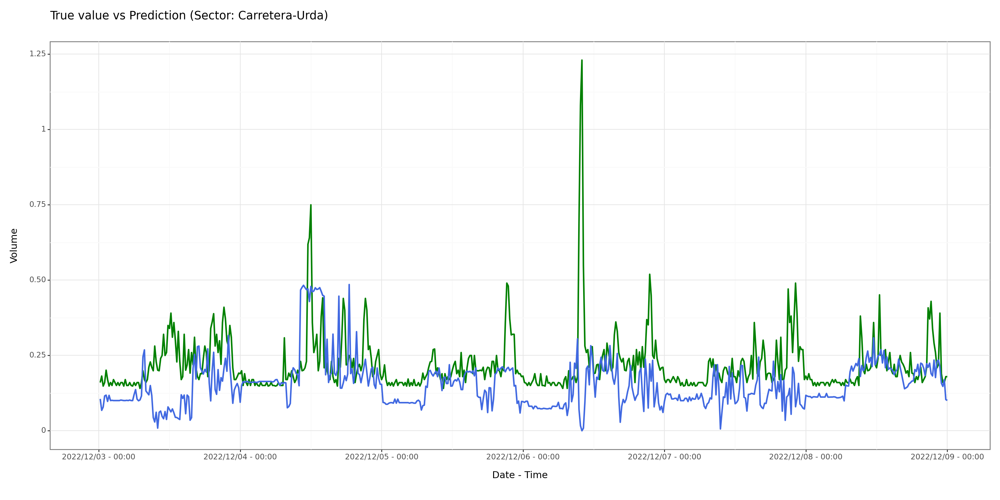

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


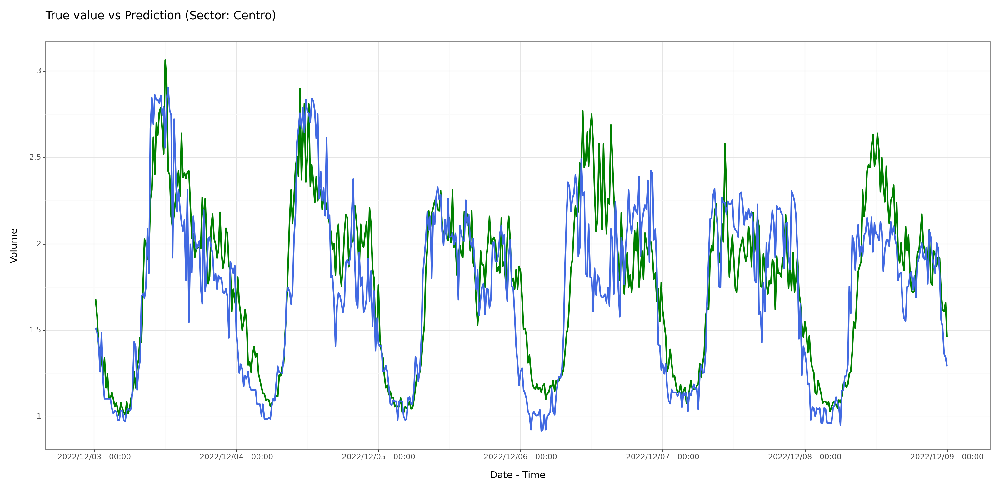

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


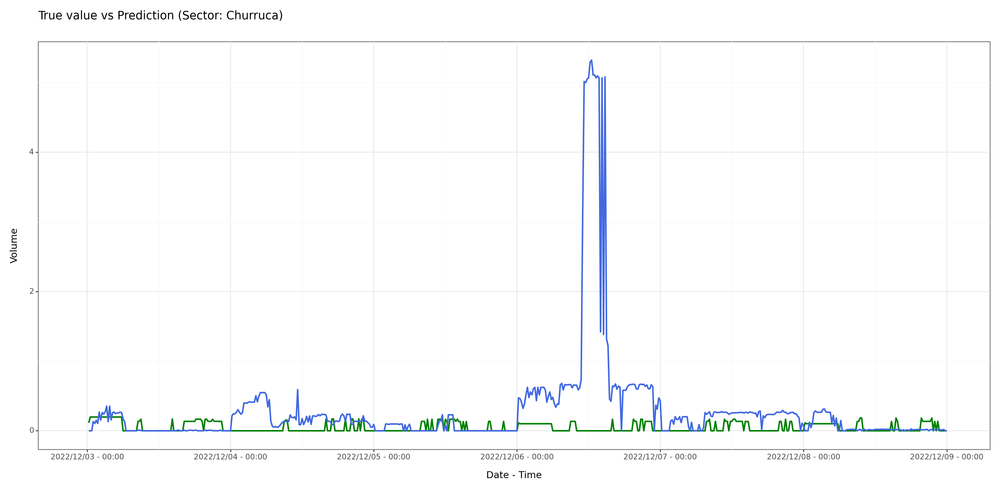

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


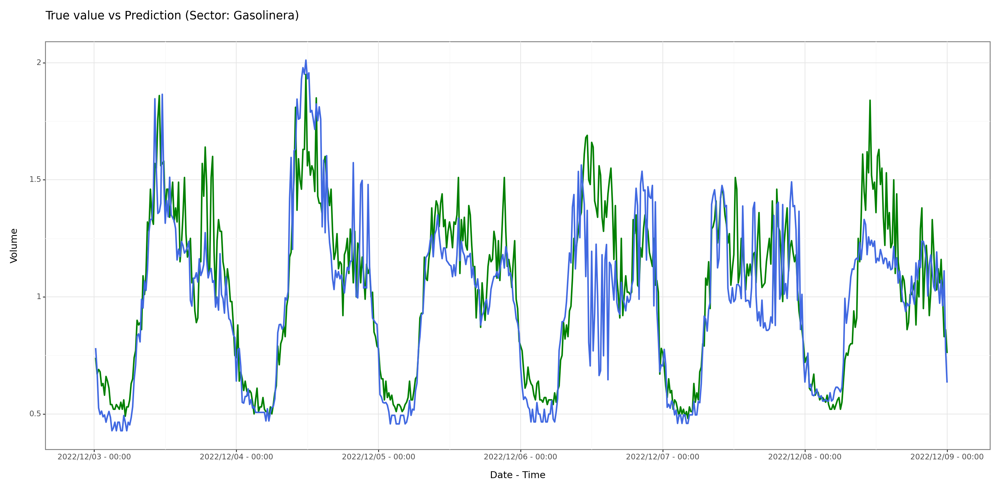

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


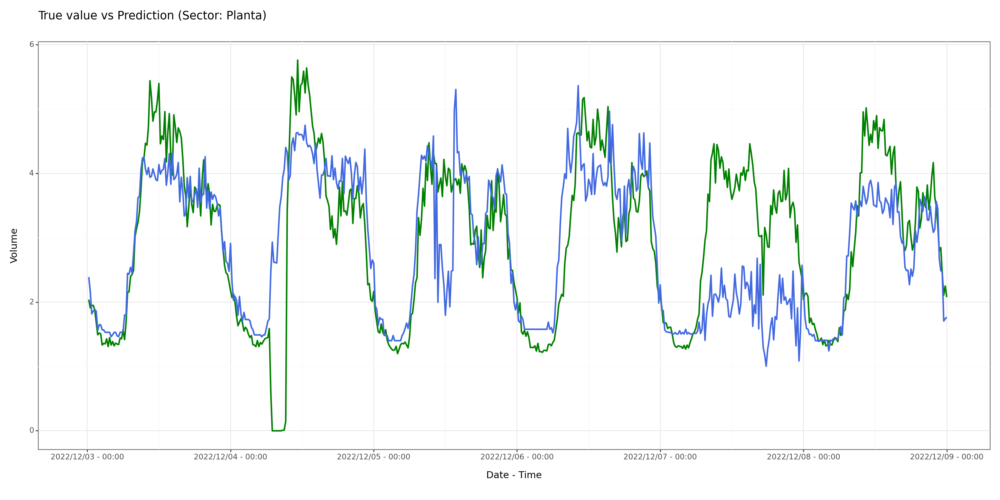

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


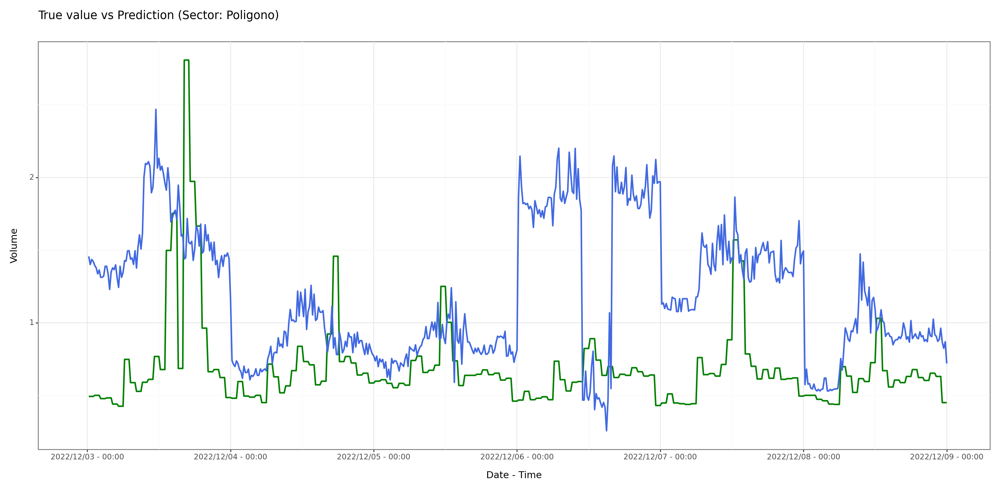

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


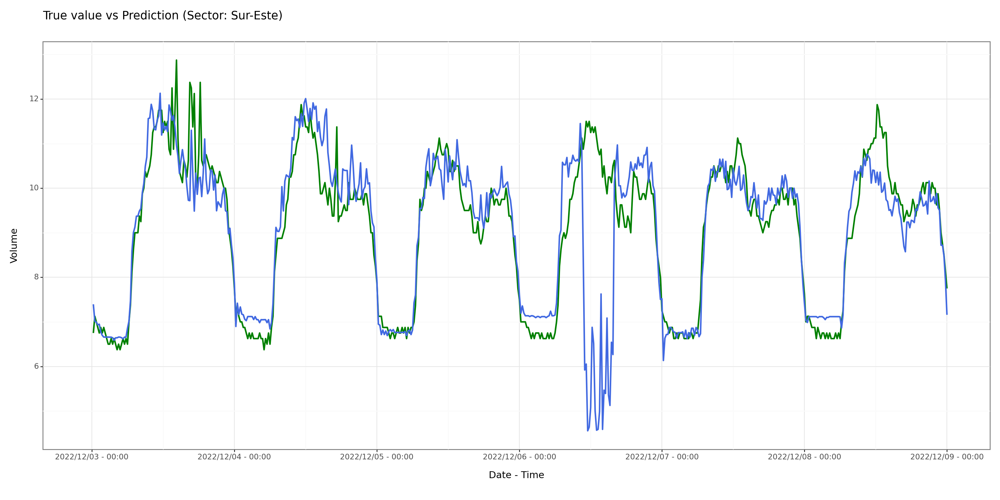

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


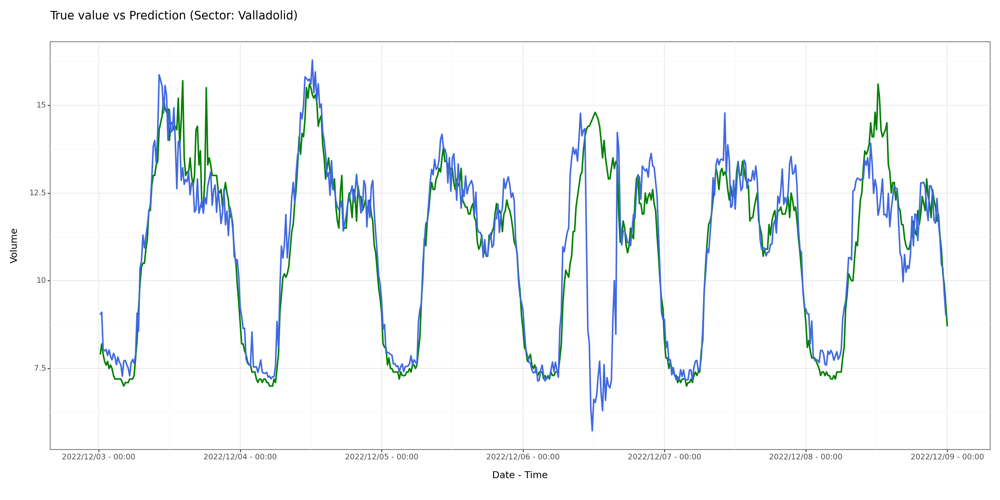

In [268]:
for i in range(0,8):
  print(g_dict[i])

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


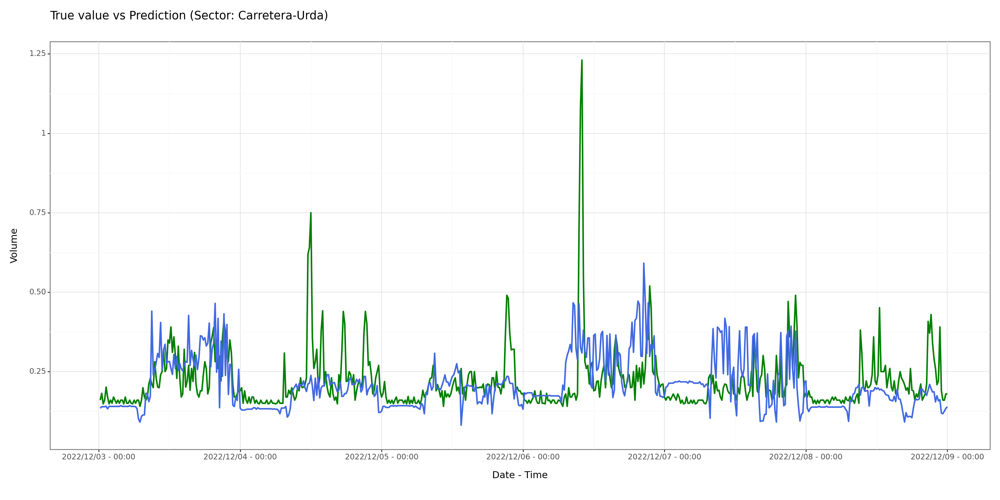

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


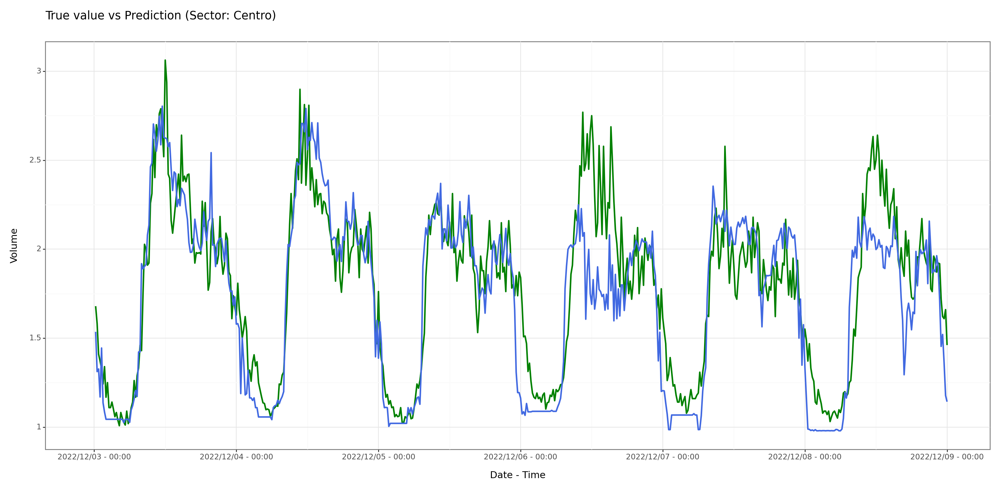

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


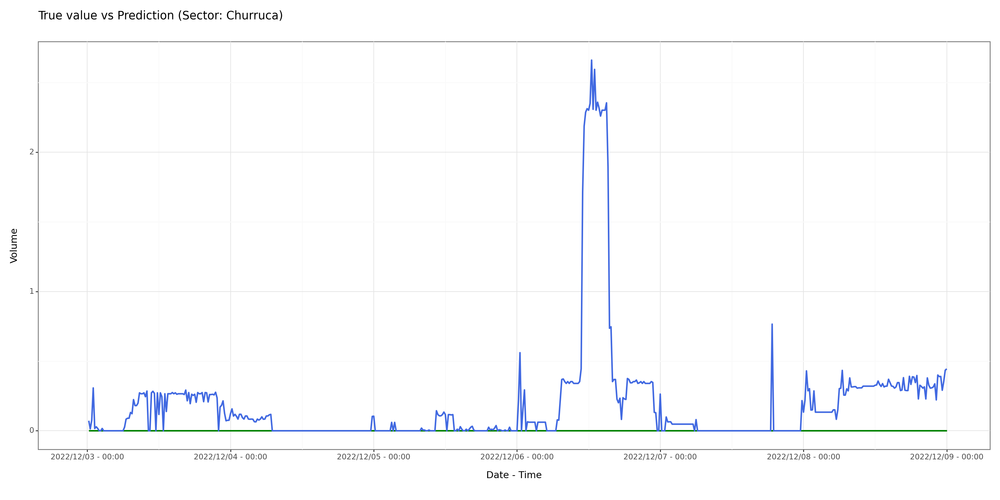

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


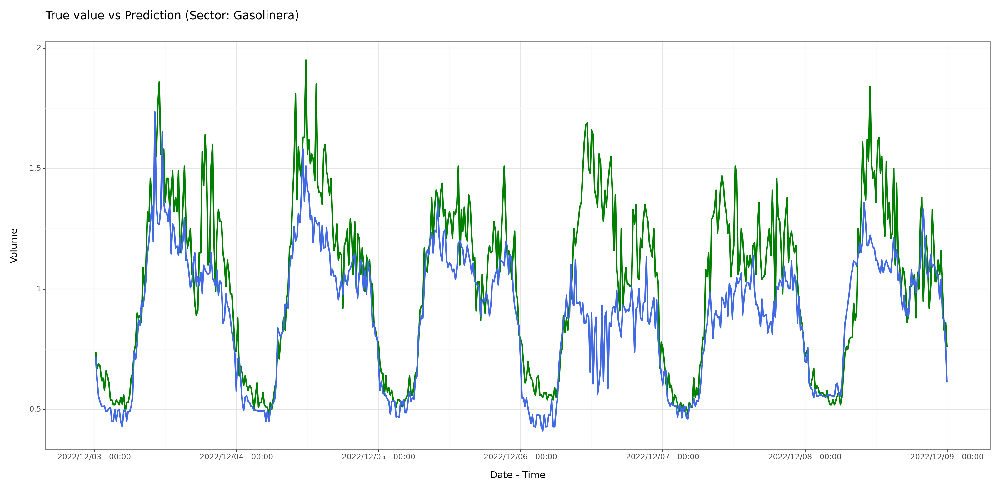

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


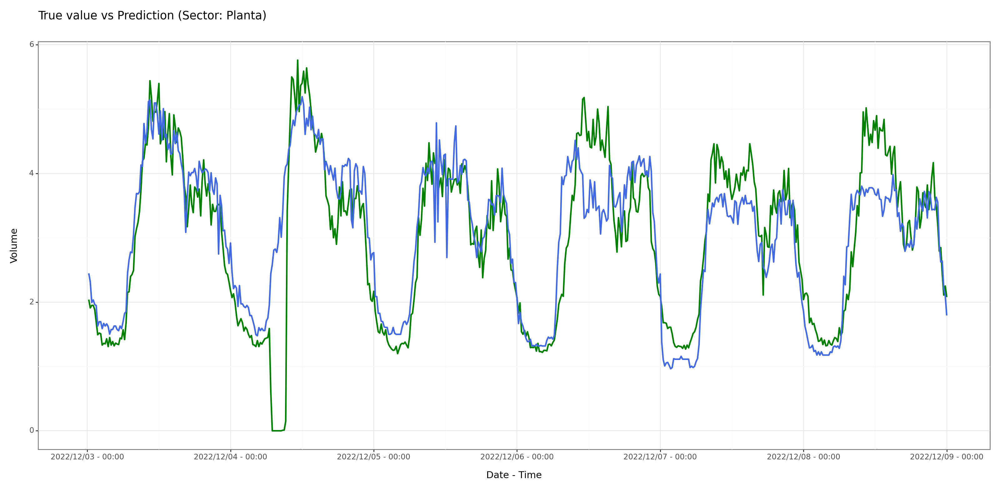

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


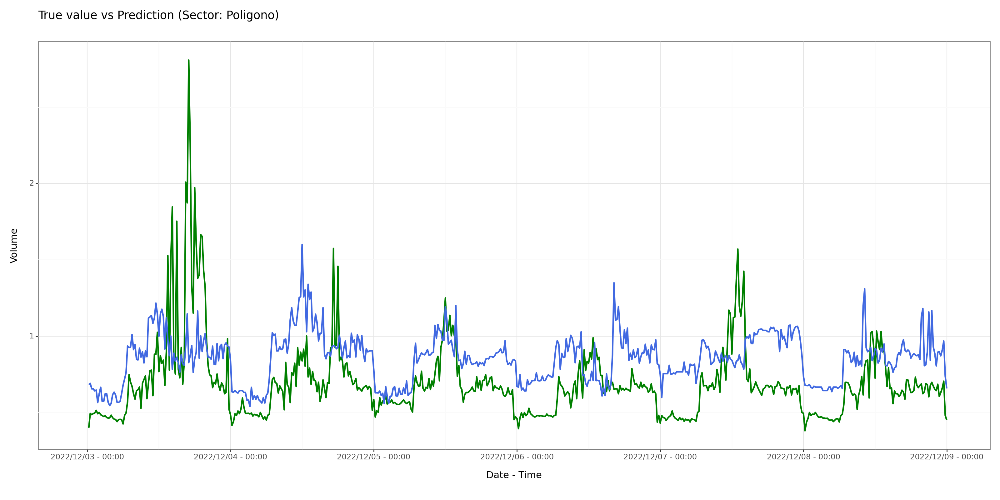

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


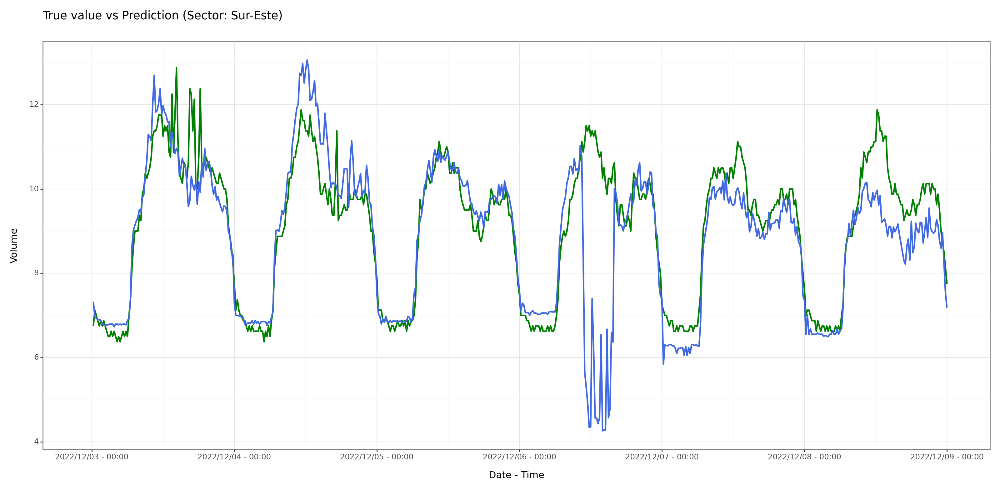

geom_path: Removed 96 rows containing missing values.
geom_path: Removed 96 rows containing missing values.
Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


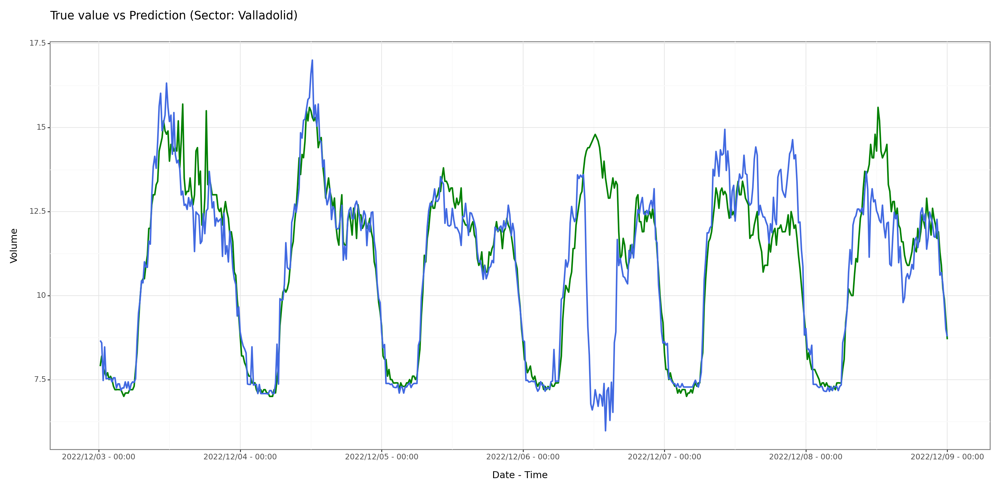

In [ ]:
for i in range(0,8):
  print(g_dict[i])

### Feature importance

In [ ]:
X = df_model[select_vars]
y = df_model[target_cols]
#Xd = xgboost.DMatrix(X, label=y)

In [ ]:
ML_model
#ML_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None, nthread=-1,
             num_parallel_tree=None, ...)

In [ ]:
imp_df

,RowKey_Date,N_DiaMes,N_Mes,N_Ano,Dia_SIN,Dia_COS,Mes_SIN,Mes_COS,V7_Centro,V7_Churruca,...,V7_Planta,V7_Sur-Este,V14_Sur-Este,V7_Valladolid,V14_Valladolid,temp_7,solarenergy_7,mint_7,dew_7,precipcover_7
0,2022-12-03,0.0180,0.0608,0.0305,0.0269,0.0093,0.0231,0.0582,0.0114,0.3555,...,0.0361,0.0510,0.0386,0.1304,0.0083,0.0160,0.0087,0.0081,0.0076,0.0069


In [ ]:
imp_df

,RowKey_Date,N_DiaMes,N_Mes,N_Ano,Dia_SIN,Mes_SIN,Mes_COS,V7_Centro,V7_Churruca,V14_Churruca,V7_Gasolinera,V14_Gasolinera,V7_Planta,V7_Sur-Este,V14_Sur-Este,V7_Valladolid,V14_Valladolid,temp_7,solarenergy_7,precipcover_7
0,2022-12-03,0.0162,0.0443,0.1492,0.0227,0.0126,0.0534,0.0105,0.3704,0.0166,0.0117,0.0228,0.0327,0.0454,0.0349,0.1208,0.0073,0.0124,0.0071,0.0091


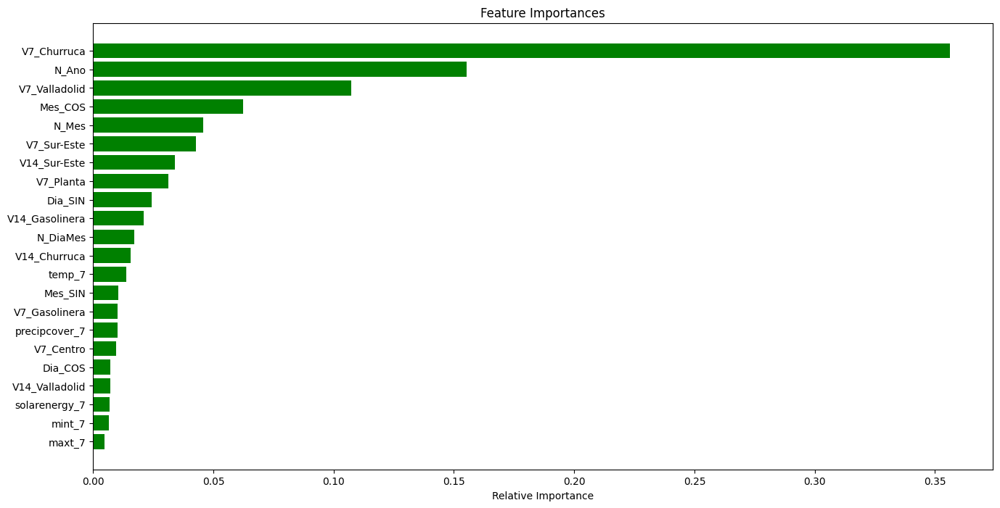

In [ ]:
importances = ML_model.feature_importances_
indices = np.argsort(importances)
features = select_vars
plt.figure(figsize=(16,8), dpi=100)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [ ]:
# compute SHAP values
explainer = shap.TreeExplainer(ML_model)
shap_values = explainer.shap_values(X)

[12:19:15] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


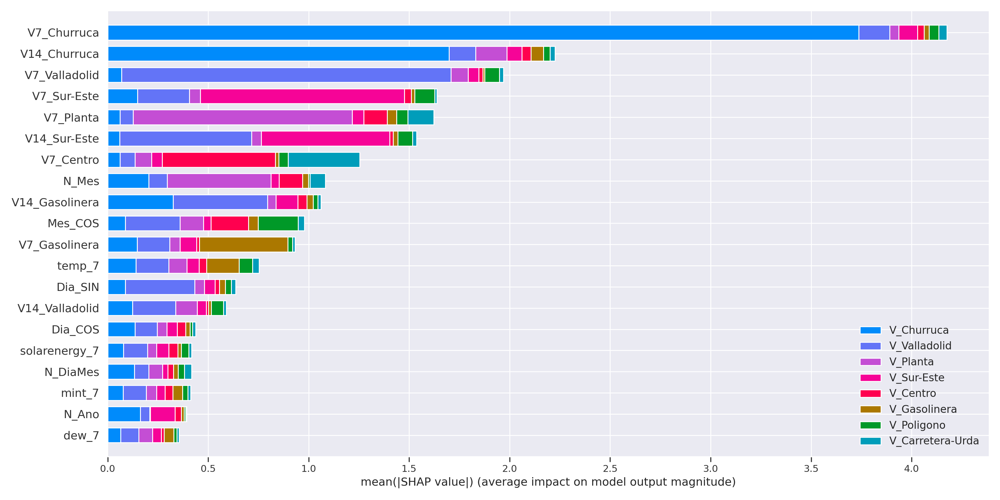

In [ ]:
shap.summary_plot(shap_values, X.values, plot_type="bar", class_names=target_cols, feature_names=X.columns, plot_size=[16,8], title='Feature Importance')

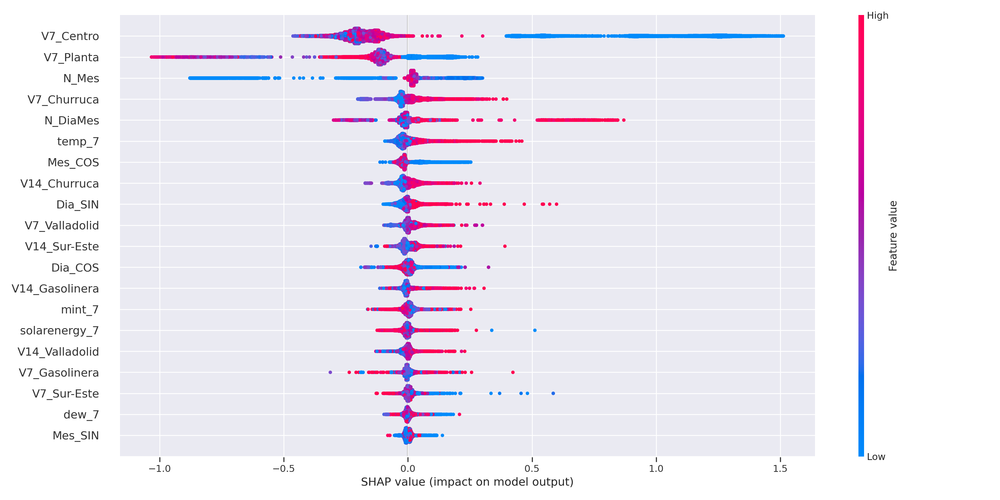

In [ ]:
shap.summary_plot(shap_values[0], X.values, feature_names = X.columns, plot_size=[16,8])

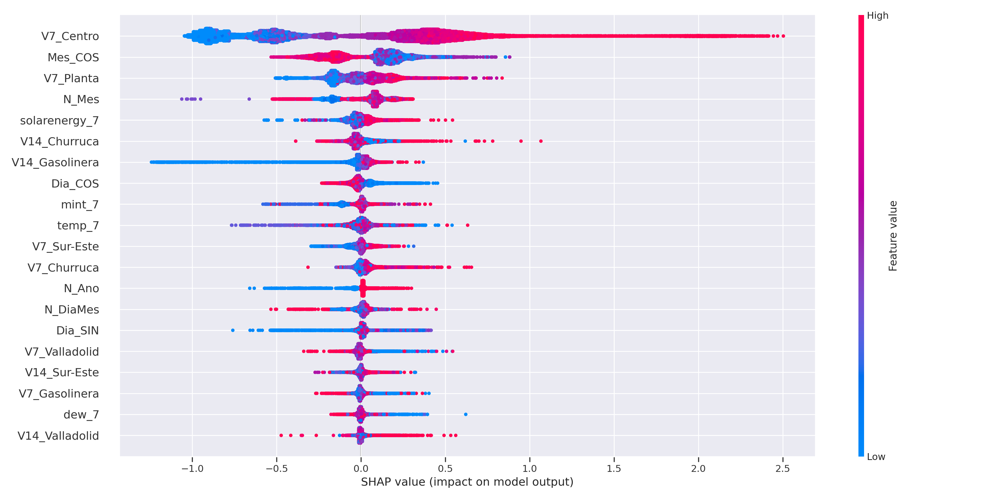

In [ ]:
shap.summary_plot(shap_values[1], X.values, feature_names=X.columns, plot_size=[16,8])

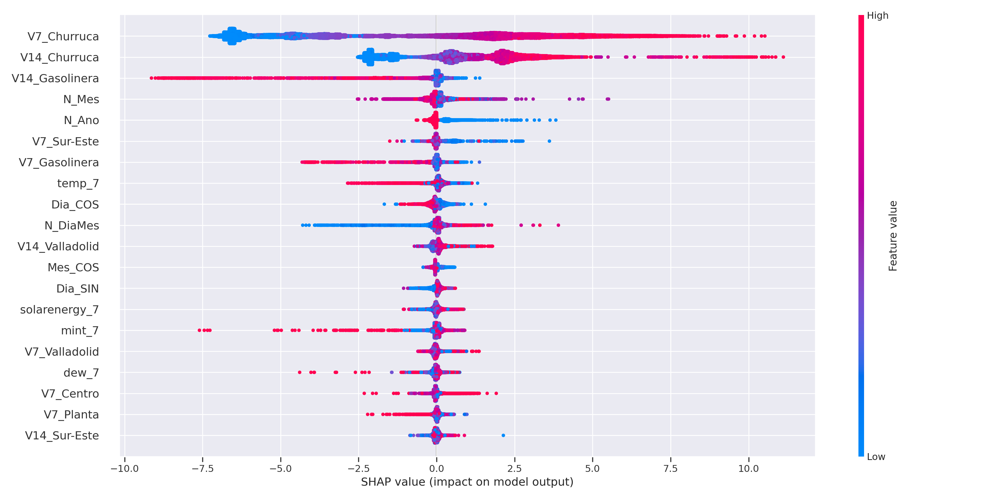

In [ ]:
shap.summary_plot(shap_values[2], X.values, feature_names = X.columns, plot_size=[16,8])

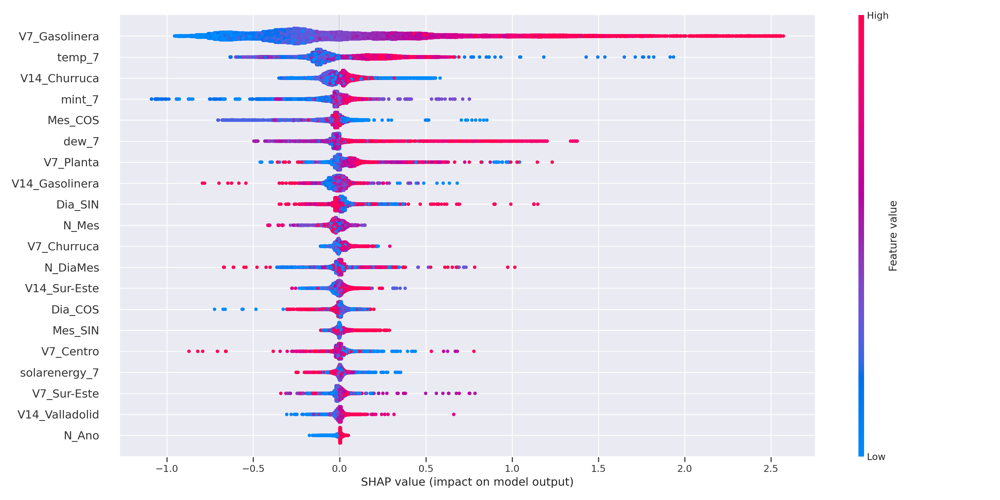

In [ ]:
shap.summary_plot(shap_values[3], X.values, feature_names = X.columns, plot_size=[16,8])